In [21]:
import json
import os
import math
import re
import pickle

import numpy as np
import pandas as pd

from IPython.display import display
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

from scipy.stats import norm

from collections import Counter

import demoji
import string

import nltk
from nltk.corpus import stopwords  # 停用词列表
from langdetect import detect  # 用于检测文本的语言
from nltk.stem import WordNetLemmatizer  # 词形还原工具


# Class

In [22]:
class Grid:
    """
    网格 用于存放网格信息
    """

    def __init__(self):
        """
        初始化网格
        """
        self.lon_left = BOUNDING_COORDINATED[0]
        self.lat_bottom = BOUNDING_COORDINATED[1]
        self.lon_right = BOUNDING_COORDINATED[2]
        self.lat_top = BOUNDING_COORDINATED[3]

        self.point_left_bottom = GridPoint([self.lon_left, self.lat_bottom])
        self.point_right_bottom = GridPoint([self.lon_right, self.lat_bottom])
        self.point_left_top = GridPoint([self.lon_left, self.lat_top])
        self.point_right_top = GridPoint([self.lon_right, self.lat_top])

        self.x_distance = compute_distance(self.point_left_bottom, self.point_right_bottom)
        self.y_distance = compute_distance(self.point_left_bottom, self.point_left_top)

        self.num_rows = int(np.ceil(self.x_distance))
        self.num_columns = int(np.ceil(self.y_distance))

        self.table = [[[] for _ in range(self.num_columns)] for _ in range(self.num_rows)]
        self.count_table = np.zeros((self.num_rows, self.num_columns))
        self.filter_count_table = []

        self.__str__()

    def __str__(self):
        """
        打印网格信息
        """
        print('The distance of longitudes is: ', self.x_distance)
        print('The number of latitudes is: ', self.y_distance)

        print('The number of rows is: ', self.num_rows)
        print('The number of columns is: ', self.num_columns)

    def add_point(self, point):
        """
        计算网格位置并添加点
        :param point: GridPoint实例
        """
        self.table[point.row][point.column].append(point)
        self.count_table[point.row][point.column] += 1


In [23]:
class GridPoint:
    """
    网格点类
    """

    def __init__(self, coordinates):
        """
        初始化网格点
        :param coordinates: 经纬度坐标 
        """
        self.lon = coordinates[0]
        self.lat = coordinates[1]
        self.row, self.column = location(self.lon, self.lat)

        self.tweet = None
        self.id = None
        self.text = None
        self.score = None
        self.token_text_remove_stopwords = None
        self.token_text_keep_stopwords = None

        self.__str__()

    def __str__(self):
        print_level(f'row: {self.row}, column: {self.column}', 1)
        print_level(f'tweet: {self.tweet}', 3)
        print_level(f'text: {self.text}', 2)
        print_level(f'token_text_remove_stopwords: {self.token_text_remove_stopwords}', 2)
        print_level(f'token_text_keep_stopwords: {self.token_text_keep_stopwords}', 2)
        print_level(f'quality_score: {self.score}', 2)

    def add_tweet(self, tweet):
        """
        添加推文
        :param tweet: 推文 JSON 字典
        """
        self.tweet = tweet
        self.id = tweet.get('_id')
        self.text = tweet.get('text')
        self.score = tweet.get('qualityScore')

    def tokenizing_text_remove_stopwords(self):
        """
        删除停顿词的情况下将文本分词
        """
        self.token_text_remove_stopwords = text_processor.tokenize_and_filter(self.text, flag_exclude_stopwords=True)

    def tokenizing_text_keep_stopwords(self):
        """
        保留停顿词的情况下将文本分词
        """
        self.token_text_keep_stopwords = text_processor.tokenize_and_filter(self.text, flag_exclude_stopwords=False)

In [24]:
class TextProcessor:
    """
    文本处理器类
    
    该类包含了一系列用于处理文本的方法，包括清洗文本、词语标准化、词语过滤等。
    """

    def __init__(self, min_token_length, min_tweet_length, flag_exclude_stopwords=True):
        # 初始化文本处理器类的参数
        self.min_token_length = min_token_length  # 设置最小的词语长度
        self.min_tweet_length = min_tweet_length  # 设置处理后的文本应包含的最小词语数量
        self.lemmatizer = WordNetLemmatizer()  # 创建词形还原器实例
        self.exclude_stopwords = flag_exclude_stopwords  # 用于控制是否排除停用词

    @staticmethod
    def _detect_language(text):
        # 尝试检测文本语言，如果失败则默认为英语
        try:
            return detect(text)
        except:
            return 'english'

    def _get_stopwords(self, language):
        if self.exclude_stopwords:  # 根据exclude_stopwords决定是否获取停用词列表
            # 获取给定语言的停用词列表，如果给定语言的停用词列表不可用，则回退到英语
            try:
                return set(stopwords.words(language))
            except:
                return set(stopwords.words('english'))
        else:
            return set()  # 如果不排除停用词，返回空集合

    @staticmethod
    def _clean_text(text):
        # 使用正则表达式清洗文本：去除非ASCII字符和URL
        # 通过正则表达式在_clean_text方法中去除URL和非ASCII字符，以简化文本清洗步骤。
        text = re.sub(r'[^\x00-\x7F]+', ' ', text)  # 去除非ASCII字符
        text = re.sub(r'https?:\/\/\S+', ' ', text)  # 去除URL
        text = demoji.replace(text, r'')  # 去除文本中的表情符号
        return text

    def _normalize(self, token):
        # 标准化词语：词形还原，转小写，去除标点
        # 如果词语以特定符号开头，直接返回原词语
        if token.startswith(('#', '@', '$', 'https')):
            return token
        if token.startswith('T&amp'):
            print_level('normalize return None, start with T&amp', 1)
            return None
        token = token.lower()  # 转为小写
        # 引入WordNetLegitimatize进行词形还原，以提高文本处理的准确性和一致性。
        token = self.lemmatizer.lemmatize(token)  # 进行词形还原
        exclude = set(string.punctuation)  # 创建标点符号集合
        token = ''.join(ch for ch in token if ch not in exclude)  # 去除标点
        return token

    def _is_valid_token(self, token, stop_words):
        # 检查词语是否有效：不在停用词列表中，不等于'&amp;'，并且长度大于最小词长度
        if token is None:
            print_level('Token is None after normalization', 1)
            return False
        valid = len(token) > self.min_token_length and token != '&amp;'
        if self.exclude_stopwords:  # 如果排除停用词，则检查token不在停用词列表中
            return valid and (token not in stop_words)
        else:
            return valid  # 如果不排除停用词，只需满足其他条件

    def tokenize_and_filter(self, text, flag_exclude_stopwords):
        self.exclude_stopwords = flag_exclude_stopwords
        # 分词和过滤主函数
        clean_text = self._clean_text(text)  # 首先清洗文本
        if not clean_text.strip():
            print_level('Clean text is empty after _clean_text', 1)
            return None
        language = self._detect_language(clean_text)  # 检测文本语言
        stop_words = self._get_stopwords(language)  # 获取相应语言的停用词列表

        tokens = []
        for word in clean_text.split():
            normalized_word = self._normalize(word)  # 标准化每个词语
            if normalized_word is None:
                continue  # 跳过添加 None 值，日志已在 _normalize 中生成
            if self._is_valid_token(normalized_word, stop_words):
                # 如果词语有效，则添加到结果列表中
                tokens.append(normalized_word)

        # 如果处理后的词语数量大于设定的最小值，返回排序后的唯一词语列表，否则返回None
        if len(tokens) <= self.min_tweet_length:
            print_level(f'tokenize_and_filter return None, len(tokens) <= {self.min_tweet_length}', 1)
            return None

        return sorted(set(tokens))

# Function

In [25]:
def print_level(s, level):
    """
    级别打印 根据全局变量PRINT_LEVE的设置进行打印 PRINT_LEVEL越高，运行时打印内容越全面
    :param s: 要打印内容
    :param level: 设置当前打印内容的打印级别
    """
    if PRINT_LEVEL >= level:
        print(s)

In [26]:
def compute_distance(point1, point2=None):
    """
    使用Haversine公式 计算地球上两点之间的距离
    :param point1: 第一个点
    :param point2: 第二个点
    :return: 两点之间的距离（千米）
    """
    # Haversine Formula
    # Convert latitude and longitude from degrees to radians
    # Unit: kilometres

    # If point2 is None, it means point1 is a list with four coordinates
    if point2 is None and isinstance(point1, list) and len(point1) == 4:
        # 传入1*4 list
        phi1 = point1[1] * (math.pi / 180)
        phi2 = point1[3] * (math.pi / 180)
        # Delta Phi
        delta1 = (point1[3] - point1[1]) * (math.pi / 180)
        # Delta Lambda
        delta2 = (point1[2] - point1[0]) * (math.pi / 180)
    # Otherwise, process as before
    elif isinstance(point1, GridPoint) and isinstance(point2, GridPoint):
        # 传入2个GridPoint
        phi1 = point1.lat * (math.pi / 180)
        phi2 = point2.lat * (math.pi / 180)
        delta1 = (point2.lat - point1.lat) * (math.pi / 180)
        delta2 = (point2.lon - point1.lon) * (math.pi / 180)
    else:
        raise TypeError(
            "Invalid input: The input must be either two GridPoint objects or a list of four coordinates.")

    # ‘a’ is the square of half the chord length between the points
    a = math.sin(delta1 / 2) ** 2 + math.cos(phi1) * math.cos(phi2) * math.sin(delta2 / 2) ** 2
    # c is the angular distance in radians
    c = 2 * math.atan2(math.sqrt(a), math.sqrt(1 - a))
    # R is the Earth's mean radius in kilometers
    R = 6373.0
    # d is the distance between the points
    d = R * c

    print_level(f'The distance between points is: {d} meters', 2)
    return d

In [27]:
def location(lon, lat):
    """
    输入经纬度，计算网格位置
    :param lon: 纬度
    :param lat: 经度
    :return: 对应的行数与列数
    """
    lon_offset = compute_distance([BOUNDING_COORDINATED[0], lat, lon, lat])
    lat_offset = compute_distance([lon, BOUNDING_COORDINATED[1], lon, lat])

    print_level(lon_offset, 3)
    print_level(lat_offset, 3)

    column = int(np.ceil(lon_offset)) - 1
    row = int(np.ceil(lat_offset)) - 1

    return row, column

In [28]:
def load_data():
    """
    加载地理数据和模型文件
    :return: 列表形式的地理数据，highQuality, lowQuality, bgQuality 模型文件
    """
    geo_datas = []
    bg_quality = []
    high_quality = []
    low_quality = []

    # 指定包含json文件的目录
    directory = 'data/datajson/'

    # 遍历目录下的所有文件
    for file_name in os.listdir(directory):
        # 确保只处理.json文件
        if file_name.endswith('.json'):
            # 构建完整的文件路径
            file_path = os.path.join(directory, file_name)
            # 打开文件
            with open(file_path, 'r', encoding='utf-8') as file:
                # 读取文件的每一行
                for line in file.readlines():
                    # 将JSON字符串解析成Python对象
                    json_obj = json.loads(line)

                    # 使用 extend() 方法将 列表json_obj 的元素添加到 列表datas 中
                    geo_datas.extend(json_obj)

    with open('data/credModelFiles/highQuality.json', 'r', encoding='utf-8') as file:
        for line in file.readlines():
            json_obj = json.loads(line)
            high_quality.append(json_obj)

    with open('data/credModelFiles/lowQuality.json', 'r', encoding='utf-8') as file:
        for line in file.readlines():
            json_obj = json.loads(line)
            low_quality.append(json_obj)

    with open('data/credModelFiles/bgQuality.json', 'r', encoding='utf-8') as file:
        for line in file.readlines():
            json_obj = json.loads(line)
            bg_quality.append(json_obj)

    print_level(f"geo_datas records loaded: {len(geo_datas)}", 1)
    print_level(f"high_quality records loaded: {len(high_quality)}", 1)
    print_level(f"low_quality records loaded: {len(low_quality)}", 1)
    print_level(f"bg_quality records loaded: {len(bg_quality)}", 1)

    return geo_datas, high_quality, low_quality, bg_quality


In [29]:
def geo_data_gridded(geo_datas, grid):
    """
    将地理数据分配到网格中
    :param geo_datas: 
    :param grid: 
    :return: 
    """

    print_level('-------- Start geo_data_gridded --------', 1)

    grid_points = []
    num_remove_stopwords = 0
    num_keep_stopwords = 0
    for index, data in enumerate(geo_datas):

        print_level(f'index: {index}; data: {data}', 2)

        point = GridPoint(data['coordinates'])
        point.add_tweet(data)  # Add to point and stemming

        print_level('-------- text processing --------', 2)

        # 删除停顿词的情况FT
        point.tokenizing_text_remove_stopwords()
        if point.token_text_remove_stopwords is None:
            print_level(f'index: {index} is None', 1)
            num_remove_stopwords += 1

        # 不删除停顿词的情况FF
        point.tokenizing_text_keep_stopwords()
        if point.token_text_keep_stopwords is None:
            print_level(f'index: {index} is None', 1)
            num_keep_stopwords += 1

        grid_points.append(point)

        grid.add_point(point)  #Calculate the grid position of the point and add it  

        if index % 500 == 0:
            print_level(f'Processed {index} records', 0)

        print_level(f'Number of None in condition of remove stopwords is: {num_remove_stopwords} / {len(geo_datas)}', 1)
        print_level(f'Number of None in condition of keep stopwords is: {num_keep_stopwords} / {len(geo_datas)}', 1)

    print_level(f'total records: {len(geo_datas)}', 0)

    print_level(f'max: {max([max(row) for row in grid.count_table])}', 0)

    return grid_points

In [30]:
def draw_combined():
    """
    绘制task1 的热力图和直方图
    """

    # 设置子图布局
    fig, axs = plt.subplots(1, 2, figsize=(20, 8))

    # 绘制热力图
    sns.heatmap(g_grids.count_table, cmap='RdBu_r', norm=matplotlib.colors.LogNorm(), ax=axs[0])
    heatmap_title = 'Heatmap of tweet counts - London' 
    axs[0].set_title(heatmap_title)

    # 准备直方图数据
    count_table_flattened = [item for sublist in g_grids.count_table for item in sublist]

    # 绘制直方图
    sns.histplot(count_table_flattened, bins=50, kde=False, ax=axs[1])
    histogram_title = 'Distribution of number - London'
    axs[1].set_title(histogram_title)
    axs[1].set_xlabel('Number of tweets')
    axs[1].set_ylabel('Number of grids')
    axs[1].set_yscale('log')

    # 调整布局
    plt.tight_layout()

    # 保存和显示图像
    file_name = 'task1/heatmap_histogram.png'
    plt.savefig(os.path.join('pictureOutput', file_name))
    plt.show()


In [31]:
def count_file(file, file_type, remove_stopwords):
    """
    统计模型文件中的词频信息
    
    :param file: 模型文件，可以是高质量、低质量、背景质量或Geo数据
    :param file_type: 统计类型标志，0表示Geo数据，1表示bgQuality数据，2表示highQuality或lowQuality数据
    :param remove_stopwords:  是否排除停用词
    :return: 词频统计结果
    """
    print_level('-------- Start count_file --------', 1)

    token_texts = []
    if file_type == 0:  # 如果是highQuality或lowQuality数据，提取text字段并进行处理
        for index, line in enumerate(file):
            text = line['text']
            print_level(f'text: {text}', 3)
            processed_text = text_processor.tokenize_and_filter(text, remove_stopwords)
            if processed_text is not None:  # 确保返回值不是 None
                token_texts.append(processed_text)
            else:
                print_level(f'index: {index} is None', 1)
                token_texts.append([])  # 如果是 None，则添加空列表

            if index % 500 == 0:
                print_level(f'Processed count {index} records', 0)
        print_level(f'total records: {len(file)}', 0)

    elif file_type == 1:  # bgQuality
        # 如果是bgQuality数据，提取text字段
        for line in file:
            token_texts.append(line['text'])

    elif file_type == 3:  # Geo
        # 如果是Geo数据
        if remove_stopwords:
            # 如果排除停用词
            token_texts = [point.token_text_remove_stopwords for point in file if
                           point.token_text_remove_stopwords is not None]
        else:
            # 如果不排除停用词
            token_texts = [point.token_text_keep_stopwords for point in file if
                           point.token_text_keep_stopwords is not None]

    print_level(f'token_texts length: {len(token_texts)}', 2)
    print_level(f'token_texts: {token_texts}', 3)

    # 统计词频信息
    term_counts = Counter(term for sublist in token_texts for term in sublist)

    print_level(f'term_counts length: {len(term_counts)}', 2)
    print_level(f'term_counts: {term_counts}', 3)

    return term_counts

In [32]:
# 该cell用于多次执行文件时快速读取之前已经处理过的部分数据

def save_counters_to_file(counters, filename):
    with open(filename, 'wb') as f:
        pickle.dump(counters, f)


def load_counters_from_file(filename):
    with open(filename, 'rb') as f:
        return pickle.load(f)


# 检查文件是否存在并进行相应操作的函数
def get_or_calculate_counters(filename):
    # 如果文件存在，从文件中加载计数器
    if os.path.isfile(filename):
        print("Loading counters from file...")
        return load_counters_from_file(filename)
    else:
        # 否则，计算并保存计数器
        print("Calculating counters...")
        counters = files_count_whether_stopwords()
        save_counters_to_file(counters, filename)
        return counters

In [33]:
def files_count_whether_stopwords():
    """
    计算词频信息
    :return: 四种词库分别在移除停顿词和保留停顿词情况下的词频统计表
    """

    print_level('-------- Start wordFrequencyCalculation --------', 1)

    count_high_quality_remove_stopwords = count_file(g_high_quality, 0, True)
    print_level(f'count_high_quality_remove_stopwords length: {len(count_high_quality_remove_stopwords)}', 0)
    count_low_quality_remove_stopwords = count_file(g_low_quality, 0, True)
    print_level(f'count_low_quality_remove_stopwords length: {len(count_low_quality_remove_stopwords)}', 0)
    count_bg_quality_remove_stopwords = count_file(g_bg_quality, 1, True)
    print_level(f'count_bg_quality_remove_stopwords length: {len(count_bg_quality_remove_stopwords)}', 0)
    count_geo_quality_remove_stopwords = count_file(g_grid_points, 2, True)
    print_level(f'count_geo_quality_remove_stopwords length: {len(count_geo_quality_remove_stopwords)}', 0)

    count_high_quality_keep_stopwords = count_file(g_high_quality, 0, False)
    print_level(f'count_high_quality_keep_stopwords length: {len(count_high_quality_keep_stopwords)}', 0)
    count_low_quality_keep_stopwords = count_file(g_low_quality, 0, False)
    print_level(f'count_low_quality_keep_stopwords length: {len(count_low_quality_keep_stopwords)}', 0)
    count_bg_quality_keep_stopwords = count_file(g_bg_quality, 1, False)
    print_level(f'count_bg_quality_keep_stopwords length: {len(count_bg_quality_keep_stopwords)}', 0)
    count_geo_quality_keep_stopwords = count_file(g_grid_points, 2, False)
    print_level(f'count_geo_quality_keep_stopwords length: {len(count_geo_quality_keep_stopwords)}', 0)

    return count_high_quality_remove_stopwords, count_low_quality_remove_stopwords, count_bg_quality_remove_stopwords, count_geo_quality_remove_stopwords, count_high_quality_keep_stopwords, count_low_quality_keep_stopwords, count_bg_quality_keep_stopwords, count_geo_quality_keep_stopwords

# Data Processing

## initialize data

In [34]:
# 确保已下载必要的NLTK资源：停用词和词形还原数据
nltk.download('stopwords')
nltk.download('wordnet')
nltk.download('omw-1.4')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package omw-1.4 to
[nltk_data]     C:\Users\Lenovo\AppData\Roaming\nltk_data...
[nltk_data]   Package omw-1.4 is already up-to-date!


True

In [ ]:
# Define folder names
folders = ['TempData', 'pictureOutput/task1', 'pictureOutput/task2', 'pictureOutput/task3']

# Check if folders exist, if not, create them
for folder in folders:
    if not os.path.exists(folder):
        os.makedirs(folder)

In [35]:
MIN_TOKEN_LENGTH = 1  # 3-5比较合适 有效词语的最小长度
MIN_TWEET_LENGTH = 3  # 可以尝试5-10 定义有效推文的最小长度 小于该长度则TWEET的text内容标记为NONE
BOUNDING_COORDINATED = [-0.563, 51.261318, 0.28036, 51.686031]

PRINT_LEVEL = 0  # 打印级别
# 0 处理过程全都不打印
# 1 处理过程部分打印
# 2 处理过程全都打印

PRINT_NUM = 10  # 最终结果的文本打印量

In [36]:
# 加载数据
g_geo_datas, g_high_quality, g_low_quality, g_bg_quality = load_data()

In [37]:
# 实例化文字处理器
text_processor = TextProcessor(min_token_length=MIN_TOKEN_LENGTH, min_tweet_length=MIN_TWEET_LENGTH)

In [38]:
# 定义配色方案
palette = sns.color_palette('dark')

## Task 1

In [39]:
# 创建网格
g_grids = Grid()

The distance of longitudes is:  58.70109803850237
The number of latitudes is:  47.24075616044219
The number of rows is:  59
The number of columns is:  48


In [40]:
# 将地理数据分配到网格中
g_grid_points = geo_data_gridded(g_geo_datas, g_grids)

Processed 0 records
Processed 500 records
Processed 1000 records
Processed 1500 records
Processed 2000 records
Processed 2500 records
Processed 3000 records
Processed 3500 records
Processed 4000 records
Processed 4500 records
Processed 5000 records
Processed 5500 records
Processed 6000 records
Processed 6500 records
Processed 7000 records
Processed 7500 records
Processed 8000 records
Processed 8500 records
Processed 9000 records
Processed 9500 records
Processed 10000 records
Processed 10500 records
Processed 11000 records
Processed 11500 records
Processed 12000 records
Processed 12500 records
Processed 13000 records
total records: 13192
max: 4265.0


In [41]:
# 用于存储计数器的文件名
filename = 'TempData/counters.pkl'

# 获取计数器的结果
counters = get_or_calculate_counters(filename)

# 计算不同设置下（stopword是否使用）词频信息
# 解包计数器
(g_count_high_quality_remove_stopwords, g_count_low_quality_remove_stopwords, g_count_bg_quality_remove_stopwords,
 g_count_geo_quality_remove_stopwords,
 g_count_high_quality_keep_stopwords, g_count_low_quality_keep_stopwords, g_count_bg_quality_keep_stopwords,
 g_count_geo_quality_keep_stopwords) = counters

Loading counters from file...


In [42]:
g_grid_points[0].token_text_remove_stopwords

['kingdom', 'london', 'photo', 'posted', 'united']

In [43]:
g_grid_points[0].token_text_keep_stopwords

['just', 'kingdom', 'london', 'photo', 'posted', 'united']

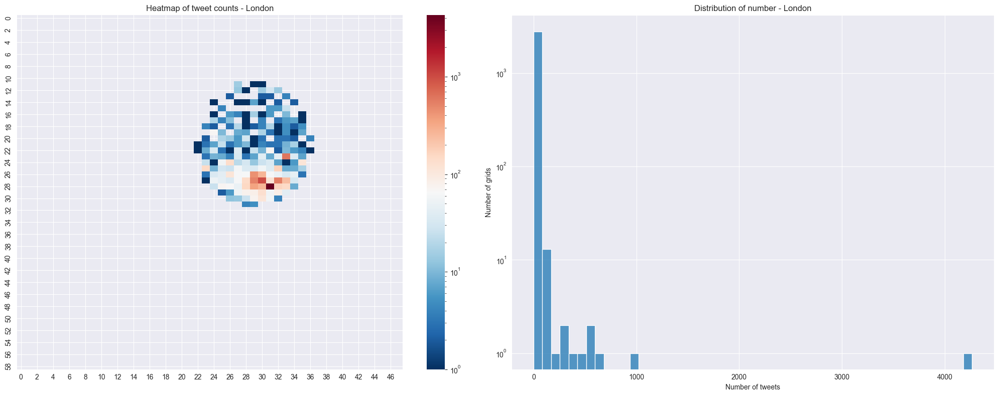

In [44]:
draw_combined()

## Task 2

In [45]:
def term_scoring(query_term, threshold_s, remove_stopwords, bg_choice):
    """
    计算词语的得分
    
    :param query_term: 查询的词语
    :param threshold_s: 阈值S
    :param remove_stopwords: 是否移除停用词
    :param bg_choice: 选择背景数据
    :return: shQt, slQt
    """
    print_level('-------- Start term_scoring --------', 1)

    print_level(f'query_term: {query_term}', 2)
    
    print_level(f'threshold_s: {threshold_s}', 2)
    print_level(f'remove_stopwords: {remove_stopwords}', 2)
    print_level(f'bg_choice: {bg_choice}', 2)
    
    # 根据是否移除stopwords的设置，选择不同的词频统计结果
    if remove_stopwords:  # 如果移除停用词
        count_HQ = g_count_high_quality_remove_stopwords
        count_LQ = g_count_low_quality_remove_stopwords
        # 选择背景数据
        if bg_choice == 'bg':  # 使用bg数据
            count_bg = g_count_bg_quality_remove_stopwords
        elif bg_choice == 'geo':  # 使用geo数据
            count_bg = g_count_geo_quality_remove_stopwords
        elif bg_choice == 'bg+geo':  # 使用geo+bg数据
            count_bg = g_count_geo_quality_remove_stopwords + g_count_bg_quality_remove_stopwords
    else:  # 如果不移除停用词
        count_HQ = g_count_high_quality_keep_stopwords
        count_LQ = g_count_low_quality_keep_stopwords
        if bg_choice == 'bg':  # 使用bg数据
            count_bg = g_count_bg_quality_keep_stopwords
        elif bg_choice == 'geo':  # 使用geo数据
            count_bg = g_count_geo_quality_keep_stopwords
        elif bg_choice == 'bg+geo':  # 使用geo+bg数据
            count_bg = g_count_geo_quality_keep_stopwords + g_count_bg_quality_keep_stopwords

    phQt = count_HQ.get(query_term, 0) / sum(count_HQ.values())
    plQt = count_LQ.get(query_term, 0) / sum(count_LQ.values())
    pbQt = count_bg.get(query_term, 0) / sum(count_bg.values())

    print_level(f'phQt: {phQt}, plQt: {plQt}, pbQt: {pbQt}', 2)

    rhqt = phQt / pbQt
    rlqt = plQt / pbQt

    print_level(f'rhqt: {rhqt}, rlqt: {rlqt}', 2)

    if rhqt > threshold_s:
        shQt = rhqt
    else:
        shQt = 0

    if rlqt > threshold_s:
        slQt = rlqt
    else:
        slQt = 0

    print_level(f'shQt: {shQt}, slQt: {slQt}', 2)

    return shQt, slQt

In [46]:
def newsworthiness(tweet_token_texts, threshold_s, remove_stopwords, bg_choice):
    """
    计算文档的新闻价值分数
    
    :param bg_choice: 
    :param remove_stopwords: 
    :param tweet_token_texts: 文档的词语列表
    :param threshold_s: 阈值S
    :return: 计算文章的新闻价值总分数
    """
    print_level('-------- Start newsworthiness --------', 1)
    # tweet_token_texts 为 None 时，直接返回，令newsworthiness Score也为None
    if tweet_token_texts is None:
        return None

    count_shQt = 0
    count_slQt = 0
    for queryTerm in tweet_token_texts:
        shQt, slQt = term_scoring(queryTerm, threshold_s, remove_stopwords, bg_choice)
        count_shQt += shQt
        count_slQt += slQt
    newsworthiness_score = math.log2((1 + count_shQt) / (1 + count_slQt))

    print_level(f'newsworthinessScore: {newsworthiness_score}', 2)

    return newsworthiness_score

In [47]:
def print_top_n(df, column_name, n):
    """
    分别输出新闻价值与总价值排名前n的与后n的text内容，用于人工检查
    :param df: 统计数据
    :param column_name: 要输出列的列名
    :param n: 前n个
    :return: None
    """
    print_level(f'top {n} {column_name}:\n', 0)
    top_n = df.nlargest(n, column_name, keep='all')
    for num, (index, row) in enumerate(top_n.iterrows()):
        print_level(f'''Top {num + 1}: {row[column_name]:.4f}, text: {row['text']}\n''', 0)

    print_level(f'bottom {n} {column_name}:\n', 0)
    bottom_n = df.nsmallest(n, column_name, keep='all')
    for num, (index, row) in enumerate(bottom_n.iterrows()):
        print_level(f'''Bottom {num + 1}: {row[column_name]:.4f}, text: {row['text']}\n''', 0)

In [48]:
def newsworthiness_scoring(df: pd.DataFrame, flag_in_geo: bool, remove_stopwords: bool, bg_choice: str, thresholds_s: float,
                           factor_nsw: float) -> list:
    """
    根据条件，计算不同的总质量分数。总质量分数是新闻价值分数和原始质量分数的加权和。
    
    :param df: 要处理的数据
    :param flag_in_geo: 要查询并计算得分的数据是geo数据还是bg数据。True表示geo数据，False表示bg数据
    :param remove_stopwords: 是否移除停用词
    :param thresholds_s: 计算S值时使用的阈值
    :param factor_nsw: 新闻价值分数的权重
    :param bg_choice: 选择背景数据, 0表示使用bg数据，1表示使用geo数据,2表示使用bg+geo数据
    :return: 新闻价值分数列表，总质量分数列表
    """
    print_level('-------- Start bg_quality_score --------', 1)

    if flag_in_geo:  # 即 task3
        print_level(f'len: {len(df)}', 1)
        
        if remove_stopwords:  # 不同情况调用不同的列表数据进行查询
            # 计算新闻价值分数
            nsw_s_column_name = f"nsw_s_{remove_stopwords}_{bg_choice}_{thresholds_s}"
            df[nsw_s_column_name] = df['token_text_remove_stopwords'].apply(newsworthiness,
                                                     args=(thresholds_s, remove_stopwords, bg_choice))
        else:
            # 计算新闻价值分数
            nsw_s_column_name = f"nsw_s_{remove_stopwords}_{bg_choice}_{thresholds_s}"
            df[nsw_s_column_name] = df['token_text_keep_stopwords'].apply(newsworthiness,
                                                     args=(thresholds_s, remove_stopwords, bg_choice))
        

        # 计算总质量分数：新闻价值分数和原始质量分数的加权和
        q_s_column_name = f'q_s_{remove_stopwords}_{bg_choice}_{thresholds_s}_{factor_nsw}'
        df[q_s_column_name] = df.apply(lambda row: factor_nsw * row[nsw_s_column_name] + (1 - factor_nsw) * row['score'],
                                       axis=1)
        # 绘制直方图
        plot_histograms_and_boxplots_with_normal_curve(df, nsw_s_column_name, q_s_column_name)
        
        # 设置绘制网格图及其分布情况的条件
        condition_mean_std = df[nsw_s_column_name] > df[nsw_s_column_name].mean()+df[nsw_s_column_name].std()
        condition_mean_2std = df[nsw_s_column_name] > df[nsw_s_column_name].mean()+2*df[nsw_s_column_name].std()
        condition_mean_3std = df[nsw_s_column_name] > df[nsw_s_column_name].mean()+3*df[nsw_s_column_name].std()
        
        # 根据条件，绘制网格图及其分布情况数据
        draw_heatmap_histogram(df, nsw_s_column_name)
        draw_heatmap_histogram(df, nsw_s_column_name, condition_mean_std)
        draw_heatmap_histogram(df, nsw_s_column_name, condition_mean_2std)
        draw_heatmap_histogram(df, nsw_s_column_name, condition_mean_3std)
        
        draw_heatmap_histogram(df, q_s_column_name)
        draw_heatmap_histogram(df, q_s_column_name, condition_mean_std)
        draw_heatmap_histogram(df, q_s_column_name, condition_mean_2std)
        draw_heatmap_histogram(df, q_s_column_name, condition_mean_3std)
        
        # 打印数据，用于人工检查
        print_top_n(df, nsw_s_column_name, PRINT_NUM)
        print_top_n(df, q_s_column_name, PRINT_NUM)
        
    else:  # 即 task2

        print_level(f'len: {len(df)}', 1)
    
        # 计算新闻价值分数
        nsw_s_column_name = f"nsw_s_{remove_stopwords}_{bg_choice}_{thresholds_s}"
        df[nsw_s_column_name] = df['text'].apply(newsworthiness,
                                                 args=(thresholds_s, remove_stopwords, bg_choice))
    
        # 计算总质量分数：新闻价值分数和原始质量分数的加权和
        q_s_column_name = f'q_s_{remove_stopwords}_{bg_choice}_{thresholds_s}_{factor_nsw}'
        df[q_s_column_name] = df.apply(lambda row: factor_nsw * row[nsw_s_column_name] + (1 - factor_nsw) * row['score'],
                                       axis=1)
        # 绘制直方图
        plot_histograms_and_boxplots_with_normal_curve(df, nsw_s_column_name, q_s_column_name)
    
        # 打印数据，用于人工检查
        print_top_n(df, nsw_s_column_name, PRINT_NUM)
        print_top_n(df, q_s_column_name, PRINT_NUM)



In [49]:
def plot_histograms_and_boxplots_with_normal_curve(df, nsw_col, qs_col):
    """
    绘制直方图和箱线图，并在每个图上添加正态分布曲线
    
    :param df: 传入的数据 
    :param nsw_col: nsw_s数据所在列
    :param qs_col: q_s数据所在列
    """
    # 定义配色方案
    palette = sns.color_palette('dark')  # 选择一个

    def plot_histograms_with_normal_curve(ax, column, color):
        # 计算均值和标准差
        mean = df[column].mean()
        std = df[column].std()
        count = len(df[column])
        
        # 计算大于 mean+std, mean+2std, mean+3std 的数量
        count_std = sum(df[column] > mean + std)
        count_2std = sum(df[column] > mean + 2 * std)
        count_3std = sum(df[column] > mean + 3 * std)

        valid_count = df[column].count()  # valid value
        min_value = df[column].min()
        percentile_25 = df[column].quantile(0.25)
        median = df[column].median()  # 中位数是第二个四分位数
        percentile_75 = df[column].quantile(0.75)
        max_value = df[column].max()
        range = df[column].max() - df[column].min()
        mode = df[column].mode()[0]
        count_eq_mode = sum(df[column] == mode)
        skew = df[column].skew()  # 偏态
        kurtosis = df[column].kurtosis()  # 峰度
        
        ratio_valid_count = valid_count / count * 100
        
        ratio_std_all = count_std / count * 100
        ratio_2std_all = count_2std / count * 100
        ratio_3std_all = count_3std / count * 100
        ratio_eq_mode_all = count_eq_mode / count * 100
        
        ratio_std_valid = count_std / valid_count * 100
        ratio_2std_valid = count_2std / valid_count * 100
        ratio_3std_valid = count_3std / valid_count * 100
        ratio_eq_mode_valid = count_eq_mode / valid_count * 100        
        
        # 绘制直方图
        count, bins, _ = ax.hist(df[column], bins=30, color=color, density=False, label=f'{column} Histogram')

        # 拟合正态分布曲线
        bin_centers = np.linspace(bins[0], bins[-1], 400)
        scale_factor = np.diff(bins)[0] * len(df[column])  # 每个柱体的宽度乘以总样本数
        pdf = norm.pdf(bin_centers, mean, std) * scale_factor  # 调整正态分布曲线的y值
        ax.plot(bin_centers, pdf, 'k-', linewidth=2, label='Normal fit')

        # 添加均值和标准差线
        ax.axvline(mean, color=palette[2], linestyle='dashed', linewidth=2, label='Mean')
        ax.axvline(mean + std, color=palette[3], linestyle='dashed', linewidth=2, label='Mean + 1 Std')
        ax.axvline(mean + 2 * std, color=palette[4], linestyle='dashed', linewidth=2, label='Mean + 2 Std')
        ax.axvline(mean + 3 * std, color=palette[6], linestyle='dashed', linewidth=2, label='Mean + 3 Std')

        # 在左侧空白区域添加文本
        ax.text(0.02, 0.70, f'valid value: {valid_count} ({ratio_valid_count:.2f}%)',
                transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02,0.66, f'min: {min_value:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.62, f'25%: {percentile_25:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.58, f'median: {median:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.54, f'75%: {percentile_75:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.50, f'max: {max_value:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.46, f'range: {range:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.42, f'skew: {skew:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.38, f'kurtosis: {kurtosis:.2f}', transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.34, f'> Mean+Std: {count_std}',
                transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.30, f' ({ratio_std_all:.2f}% (all) {ratio_std_valid:.2f}% (valid))',
                transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.26, f'> Mean+2Std: {count_2std}',
                transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.22, f' ({ratio_2std_all:.2f}% (all) {ratio_2std_valid:.2f}% (valid))',
                transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.18, f'> Mean+3Std: {count_3std}',
                transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.14, f' ({ratio_3std_all:.2f}% (all) {ratio_3std_valid:.2f}% (valid))',
                transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.10, f'mode: {mode:.4f}; num: {count_eq_mode}',
                transform=ax.transAxes, verticalalignment='top', fontsize=10)
        ax.text(0.02, 0.06, f' ({ratio_eq_mode_all:.2f}% (all) {ratio_eq_mode_valid:.2f}% (valid))',
                transform=ax.transAxes, verticalalignment='top', fontsize=10)


        # 设置标题并显示图例
        ax.set_title(f'{column} Distribution')
        ax.legend()

    def plot_scatter(ax, y_col, color, label):
        ax.scatter(df.index, df[y_col], alpha=0.5, color=color, label=label)
        ax.set_xlabel('index')
        ax.set_ylabel('score')
        ax.set_title(f'Score Relation with {nsw_col} and {qs_col}')
        ax.legend()
        ax.grid(True)

    # 使用函数绘制直方图和散点图
    fig, axs = plt.subplots(1, 3, figsize=(18, 6))

    plot_histograms_with_normal_curve(axs[0], nsw_col, palette[0])
    plot_histograms_with_normal_curve(axs[1], qs_col, palette[1])
    plot_scatter(axs[2], nsw_col, palette[0], 'NSW Score')
    plot_scatter(axs[2], qs_col, palette[1], 'QS Score')

    info = qs_col.split('_')

    s_title = f'remove_stopwords: {info[-4]}, bg_choice: {info[-3]}, thresholds_s: {info[-2]}, factor_nsw: {info[-1]}'
    fig.suptitle(s_title, fontsize=14, fontweight='bold')

    plt.tight_layout()

    s_file_name = f'{info[-4]}_{info[-3]}_{info[-2]}_{info[-1]}'
    plt.savefig(f'{CURRENT_OUTPUT}/{s_file_name}.png')

    plt.show()

In [50]:
def draw_total_statistic(df, flag_in_geo:bool):
    """
    画出所有新闻得分的直方图的折线比较图，以及总质量分数的直方图的折线比较图
    
    :param df: 要处理的数据
    :param flag_in_geo: 要查询并计算得分的数据是geo数据还是bg数据。True表示geo数据，False表示bg数据
    """
    if flag_in_geo:  # 即 task3, 从第7列开始是评分相关的列
        start_num = 7
    else:  # 即 task2, 从第2列开始是评分相关的列
        start_num = 2
    # 数据处理：计算mean+std, mean+2std, mean+3std的数量
    std_metrics = {}
    for col in df.columns[start_num:]:  # 仅针对评分相关的列
        mean_val = df[col].mean()
        std_val = df[col].std()
        std_metrics[col] = [
            (df[col] > (mean_val + std_val)).sum(),
            (df[col] > (mean_val + 2 * std_val)).sum(),
            (df[col] > (mean_val + 3 * std_val)).sum()
        ]

    # 转换为DataFrame以便于作图
    std_metrics_df = pd.DataFrame.from_dict(std_metrics, orient='index', columns=['mean+std', 'mean+2std', 'mean+3std'])

    # Adjusting the size and layout of the figures to enhance readability
    fig, axs = plt.subplots(1, 2, figsize=(16, 6), tight_layout=True)

    # Line Plot
    std_metrics_df.plot(kind='line', marker='o', ax=axs[0])
    axs[0].set_title('Counts Above mean+std, mean+2std, mean+3std', fontsize=12, fontweight='bold')
    axs[0].set_xlabel('Metrics')
    axs[0].set_xticks(range(len(std_metrics_df)))  # 设置刻度的位置
    axs[0].set_xticklabels(std_metrics_df.index, rotation=90, fontsize=10)  # 设置刻度标签
    axs[0].set_ylabel('Count')
    axs[0].legend(title='Thresholds')
    axs[0].grid(True)

    # Boxplot - Including more detailed analysis for outliers
    df[df.columns[2:]].boxplot(ax=axs[1], rot=45, fontsize=10)
    axs[1].set_title('Metrics Distribution with Outliers')

    # 设置箱型图的x轴标签
    axs[1].set_xticklabels(df.columns[start_num:], rotation=90, fontsize=10)
    axs[1].set_title('Metrics Distribution with Outliers', fontsize=12, fontweight='bold')

    plt.tight_layout()
    plt.savefig(f'{CURRENT_OUTPUT}/total_statistic.png')
    plt.show()

In [51]:
def statistic2():
    # task2 的数据处理
    df_bg = pd.DataFrame(g_bg_quality)
    print_level(f'len: {len(df_bg)}', 0)
    for remove_stopwords in [True, False]:
        for thresholds_s in [1, 2, 3]:
            for factor_nsw in [0.2, 0.5, 0.8]:
                print_level(f'remove_stopwords: {remove_stopwords}, bg_choice: bg, thresholds_s: {thresholds_s}, factor_nsw: {factor_nsw}', 0)

                newsworthiness_scoring(df_bg, False, remove_stopwords, 'bg',
                                       thresholds_s, factor_nsw)

    display(df_bg)
    draw_total_statistic(df_bg, False)
    df_bg.to_csv('TempData/df_bg.csv')


In [52]:
pd.DataFrame(g_bg_quality)

,_id,text,score
0,1613006911946776576,"[confidence, dont, fix, lost, need, negative, ...",0.636730
1,1613006916246179840,"[academic, age, approaching, best, biogerontol...",0.614933
2,1613006917810683904,"[album, dreams, london, underrated]",0.541453
3,1613006921556185089,"[apartment, leaky, month, new, paying, pipes, ...",0.636528
4,1613006922894000128,"[carabao, confirmed, congestion, cup, dates, f...",0.589902
...,...,...,...
2234,1615746986057007113,"[@Sunita_Says_, provoking, thought]",0.665500
2235,1615746987940511744,"[@GMB, @Lilly26062173, @edballs, beds, care, d...",0.586667
2236,1615746988481314818,"[2nd, @leahwillFP6, allowed, arsenal, beth, cl...",0.674884
2237,1615746990251593729,"[eat, say, wanna, wear]",0.629744


len: 2239
remove_stopwords: True, bg_choice: bg, thresholds_s: 1, factor_nsw: 0.2


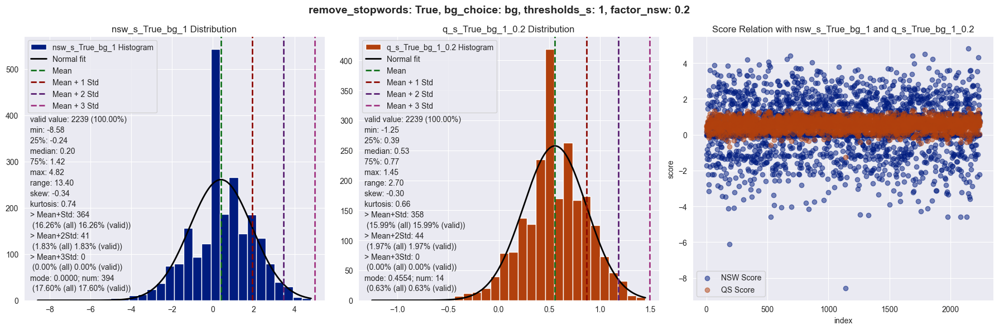

top 10 nsw_s_True_bg_1:

Top 1: 4.8170, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 2: 4.4971, text: ['#hiring', '#job:', '#jobs', 'admin', 'based', 'construction', 'dublin', 'https://t.co/ZtYiMBUzmz', 'location', 'new', 'office', 'salary', 'sales', 'south', '€37kpa', '€42k', '€46kpa']

Top 3: 4.4168, text: ['2023', '25th', 'book', 'canapes', 'centre', 'circle', 'city', 'cost', 'drink', 'expand', 'gusto', 'includes', 'jan', 'looking', 'manchester', 'network', 'new', 'place', 'professional', 'sponsors', 'ticket', 'weds', 'welcome', 'year']

Top 4: 4.4137, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 5: 4.3066, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 6: 4.2353, text: ['#China', 'accused', 'buying', 'company', 'government', 'semic

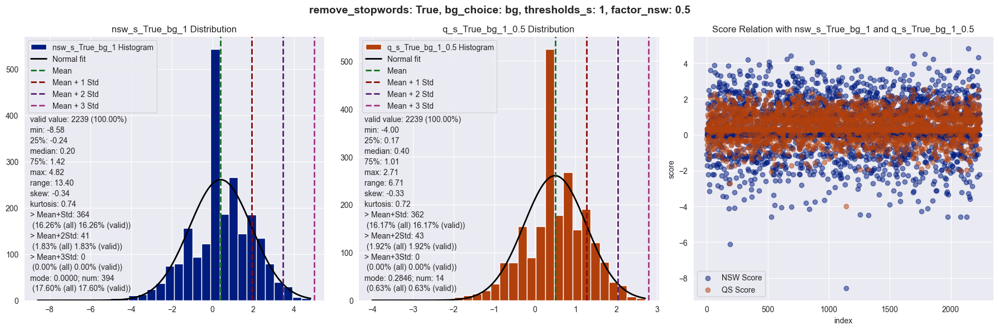

top 10 nsw_s_True_bg_1:

Top 1: 4.8170, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 2: 4.4971, text: ['#hiring', '#job:', '#jobs', 'admin', 'based', 'construction', 'dublin', 'https://t.co/ZtYiMBUzmz', 'location', 'new', 'office', 'salary', 'sales', 'south', '€37kpa', '€42k', '€46kpa']

Top 3: 4.4168, text: ['2023', '25th', 'book', 'canapes', 'centre', 'circle', 'city', 'cost', 'drink', 'expand', 'gusto', 'includes', 'jan', 'looking', 'manchester', 'network', 'new', 'place', 'professional', 'sponsors', 'ticket', 'weds', 'welcome', 'year']

Top 4: 4.4137, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 5: 4.3066, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 6: 4.2353, text: ['#China', 'accused', 'buying', 'company', 'government', 'semic

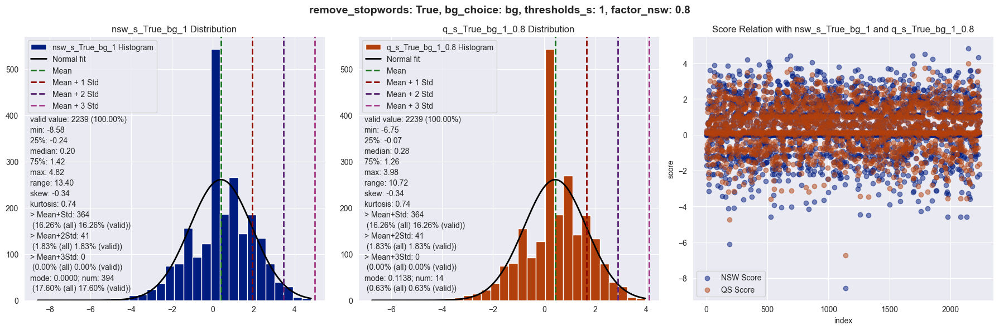

top 10 nsw_s_True_bg_1:

Top 1: 4.8170, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 2: 4.4971, text: ['#hiring', '#job:', '#jobs', 'admin', 'based', 'construction', 'dublin', 'https://t.co/ZtYiMBUzmz', 'location', 'new', 'office', 'salary', 'sales', 'south', '€37kpa', '€42k', '€46kpa']

Top 3: 4.4168, text: ['2023', '25th', 'book', 'canapes', 'centre', 'circle', 'city', 'cost', 'drink', 'expand', 'gusto', 'includes', 'jan', 'looking', 'manchester', 'network', 'new', 'place', 'professional', 'sponsors', 'ticket', 'weds', 'welcome', 'year']

Top 4: 4.4137, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 5: 4.3066, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 6: 4.2353, text: ['#China', 'accused', 'buying', 'company', 'government', 'semic

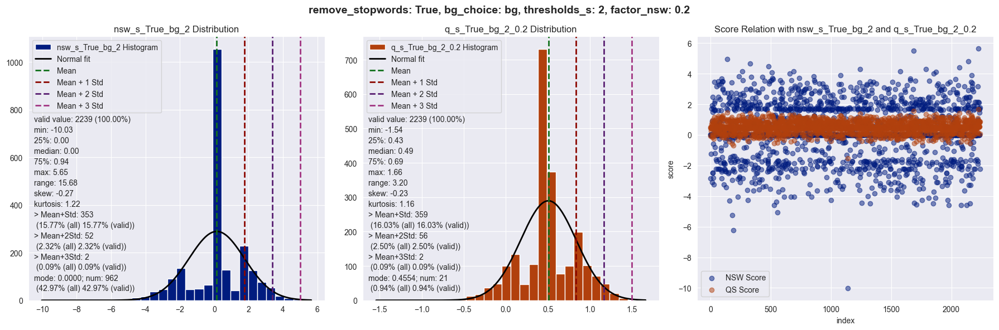

top 10 nsw_s_True_bg_2:

Top 1: 5.6482, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 2: 5.4861, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 3: 4.9399, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.8170, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 5: 4.6560, text: ['apply', 'available', 'babysitter', 'contact', 'hotel', 'information', 'lovely', 'marriott', 'opportunities', 'park', 'please', 'position', 'regents', 'role', 'send', 'visit', 'website']

Top 6: 4.4833, text: ['2022', '2023', 'activity', 'careers', 'consultancy', 'employers', 'engagement', 'explains', 'fluctuated', 'head', '

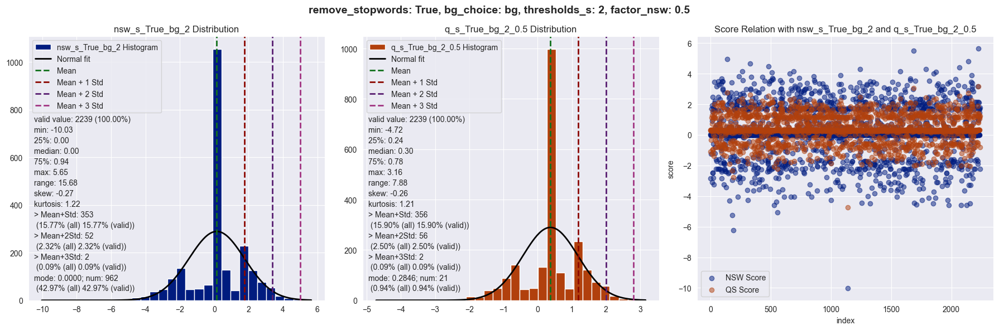

top 10 nsw_s_True_bg_2:

Top 1: 5.6482, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 2: 5.4861, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 3: 4.9399, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.8170, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 5: 4.6560, text: ['apply', 'available', 'babysitter', 'contact', 'hotel', 'information', 'lovely', 'marriott', 'opportunities', 'park', 'please', 'position', 'regents', 'role', 'send', 'visit', 'website']

Top 6: 4.4833, text: ['2022', '2023', 'activity', 'careers', 'consultancy', 'employers', 'engagement', 'explains', 'fluctuated', 'head', '

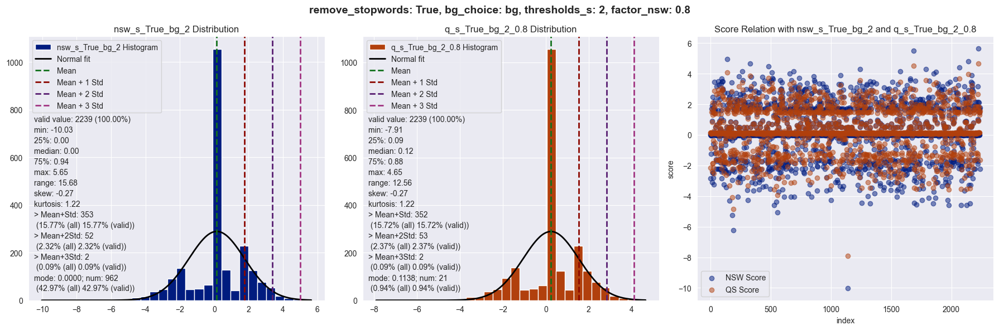

top 10 nsw_s_True_bg_2:

Top 1: 5.6482, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 2: 5.4861, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 3: 4.9399, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.8170, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 5: 4.6560, text: ['apply', 'available', 'babysitter', 'contact', 'hotel', 'information', 'lovely', 'marriott', 'opportunities', 'park', 'please', 'position', 'regents', 'role', 'send', 'visit', 'website']

Top 6: 4.4833, text: ['2022', '2023', 'activity', 'careers', 'consultancy', 'employers', 'engagement', 'explains', 'fluctuated', 'head', '

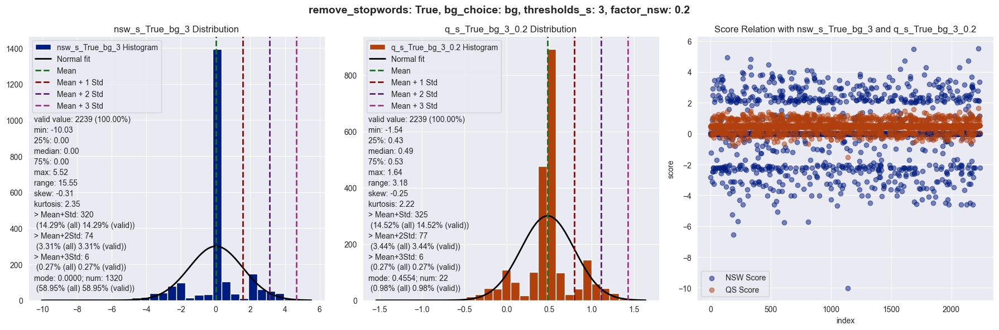

top 10 nsw_s_True_bg_3:

Top 1: 5.5179, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 2: 5.4861, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 3: 4.9399, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.8418, text: ['#handmade', '#hats', '#shopindie', 'custom', 'far', 'good', 'hat', 'long', 'looking', 'pretty', 'today', 'version', 'way', 'yet']

Top 5: 4.7049, text: ['addict', 'air', 'alcoholic', 'behaviour', 'believe', 'cant', 'disgraceful', 'drinking', 'drug', 'well']

Top 6: 4.7049, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 7: 4.4833, text: ['2022', '2023', 'activity', 'careers', 'cons

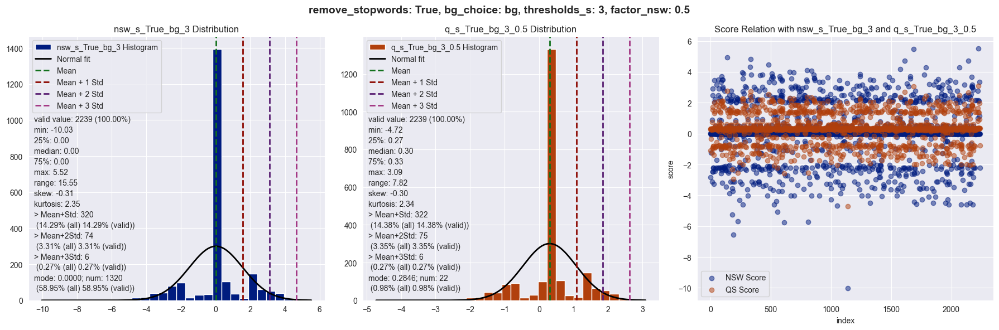

top 10 nsw_s_True_bg_3:

Top 1: 5.5179, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 2: 5.4861, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 3: 4.9399, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.8418, text: ['#handmade', '#hats', '#shopindie', 'custom', 'far', 'good', 'hat', 'long', 'looking', 'pretty', 'today', 'version', 'way', 'yet']

Top 5: 4.7049, text: ['addict', 'air', 'alcoholic', 'behaviour', 'believe', 'cant', 'disgraceful', 'drinking', 'drug', 'well']

Top 6: 4.7049, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 7: 4.4833, text: ['2022', '2023', 'activity', 'careers', 'cons

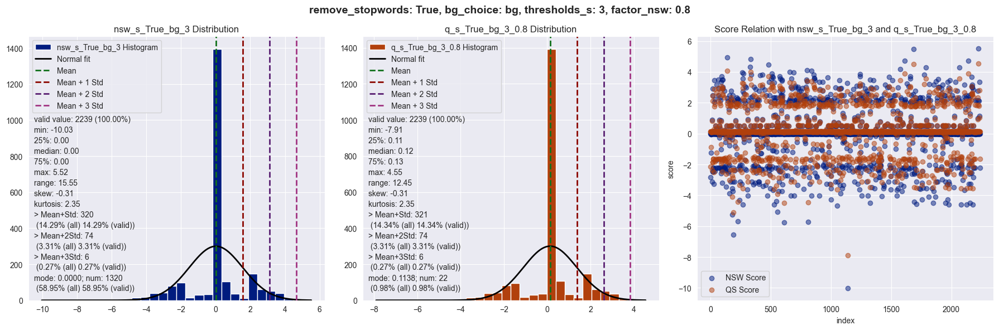

top 10 nsw_s_True_bg_3:

Top 1: 5.5179, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 2: 5.4861, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 3: 4.9399, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.8418, text: ['#handmade', '#hats', '#shopindie', 'custom', 'far', 'good', 'hat', 'long', 'looking', 'pretty', 'today', 'version', 'way', 'yet']

Top 5: 4.7049, text: ['addict', 'air', 'alcoholic', 'behaviour', 'believe', 'cant', 'disgraceful', 'drinking', 'drug', 'well']

Top 6: 4.7049, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 7: 4.4833, text: ['2022', '2023', 'activity', 'careers', 'cons

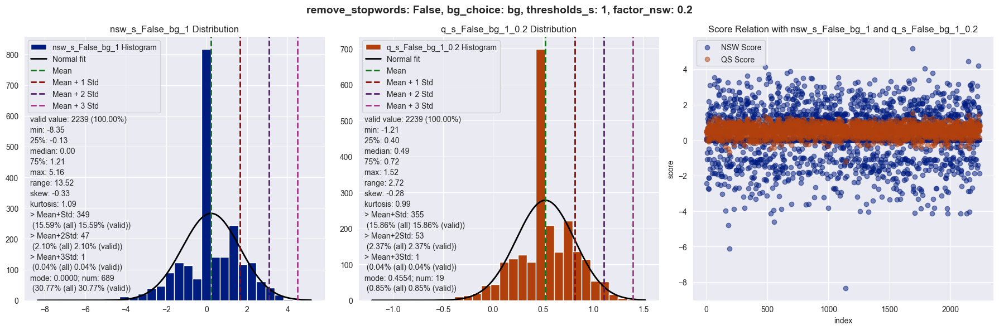

top 10 nsw_s_False_bg_1:

Top 1: 5.1627, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 2: 4.4427, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 3: 4.1868, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 4: 4.1131, text: ['2022', '2023', 'activity', 'careers', 'consultancy', 'employers', 'engagement', 'explains', 'fluctuated', 'head', 'means', 'planning']

Top 5: 4.0425, text: ['#hiring', '#job:', '#jobs', 'admin', 'based', 'construction', 'dublin', 'https://t.co/ZtYiMBUzmz', 'location', 'new', 'office', 'salary', 'sales', 'south', '€37kpa', '€42k', '€46kpa']

Top 6: 3.8813, text: ['2023', '25th', 'book', 'canapes', 'centre', 'circle', 'city', 'cost', 'drink', 'expand', 'gusto', 'includes', 'jan', 'looking', 'manchester', 'network', 'new',

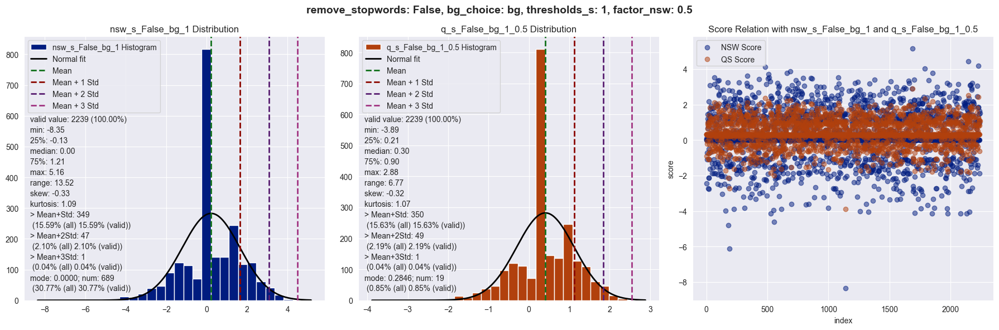

top 10 nsw_s_False_bg_1:

Top 1: 5.1627, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 2: 4.4427, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 3: 4.1868, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 4: 4.1131, text: ['2022', '2023', 'activity', 'careers', 'consultancy', 'employers', 'engagement', 'explains', 'fluctuated', 'head', 'means', 'planning']

Top 5: 4.0425, text: ['#hiring', '#job:', '#jobs', 'admin', 'based', 'construction', 'dublin', 'https://t.co/ZtYiMBUzmz', 'location', 'new', 'office', 'salary', 'sales', 'south', '€37kpa', '€42k', '€46kpa']

Top 6: 3.8813, text: ['2023', '25th', 'book', 'canapes', 'centre', 'circle', 'city', 'cost', 'drink', 'expand', 'gusto', 'includes', 'jan', 'looking', 'manchester', 'network', 'new',

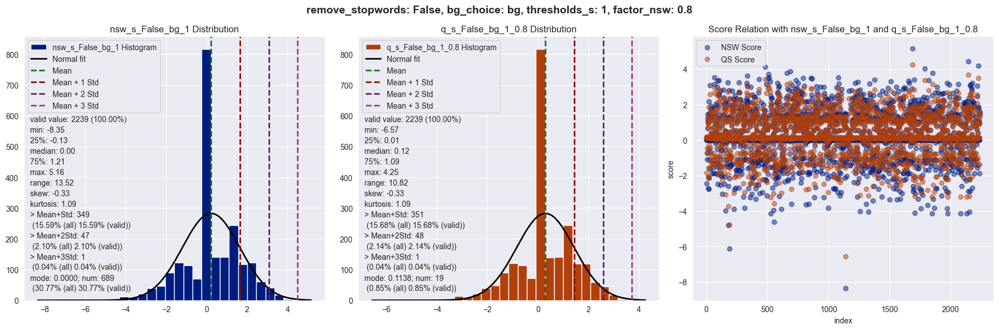

top 10 nsw_s_False_bg_1:

Top 1: 5.1627, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 2: 4.4427, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 3: 4.1868, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 4: 4.1131, text: ['2022', '2023', 'activity', 'careers', 'consultancy', 'employers', 'engagement', 'explains', 'fluctuated', 'head', 'means', 'planning']

Top 5: 4.0425, text: ['#hiring', '#job:', '#jobs', 'admin', 'based', 'construction', 'dublin', 'https://t.co/ZtYiMBUzmz', 'location', 'new', 'office', 'salary', 'sales', 'south', '€37kpa', '€42k', '€46kpa']

Top 6: 3.8813, text: ['2023', '25th', 'book', 'canapes', 'centre', 'circle', 'city', 'cost', 'drink', 'expand', 'gusto', 'includes', 'jan', 'looking', 'manchester', 'network', 'new',

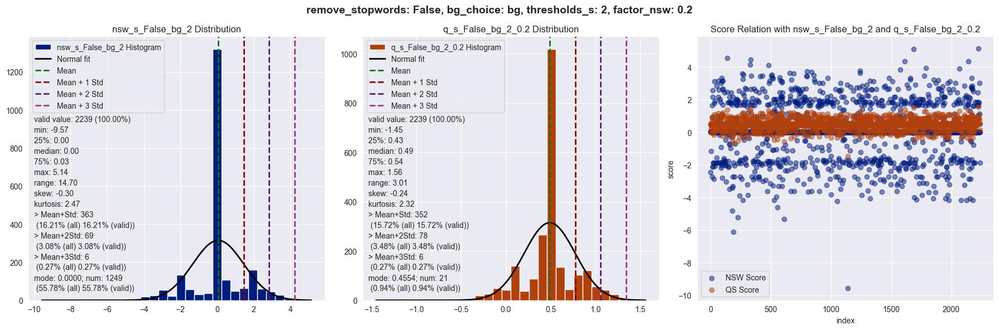

top 10 nsw_s_False_bg_2:

Top 1: 5.1375, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 2: 5.1059, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 3: 4.5643, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.4672, text: ['#handmade', '#hats', '#shopindie', 'custom', 'far', 'good', 'hat', 'long', 'looking', 'pretty', 'today', 'version', 'way', 'yet']

Top 5: 4.3319, text: ['addict', 'air', 'alcoholic', 'behaviour', 'believe', 'cant', 'disgraceful', 'drinking', 'drug', 'well']

Top 6: 4.3319, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 7: 4.1469, text: ['apply', 'available', 'babysitter', 'contac

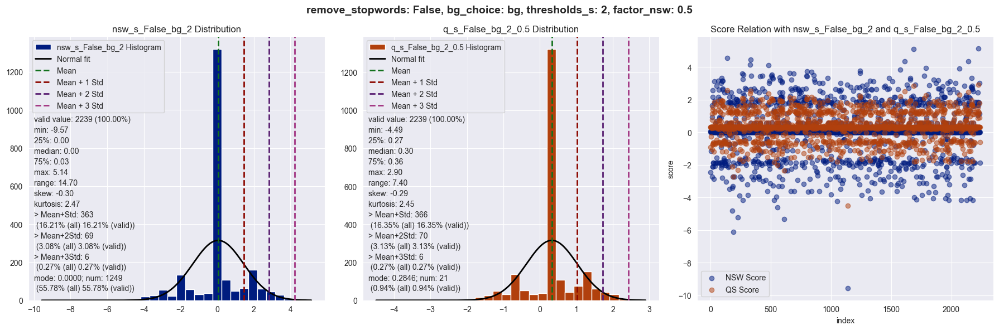

top 10 nsw_s_False_bg_2:

Top 1: 5.1375, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 2: 5.1059, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 3: 4.5643, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.4672, text: ['#handmade', '#hats', '#shopindie', 'custom', 'far', 'good', 'hat', 'long', 'looking', 'pretty', 'today', 'version', 'way', 'yet']

Top 5: 4.3319, text: ['addict', 'air', 'alcoholic', 'behaviour', 'believe', 'cant', 'disgraceful', 'drinking', 'drug', 'well']

Top 6: 4.3319, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 7: 4.1469, text: ['apply', 'available', 'babysitter', 'contac

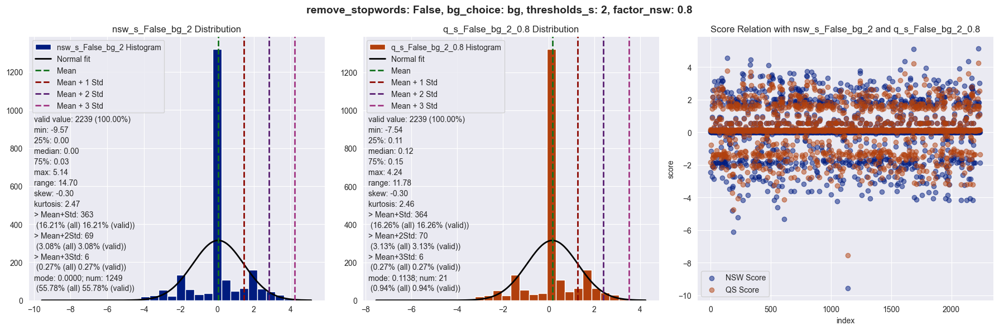

top 10 nsw_s_False_bg_2:

Top 1: 5.1375, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 2: 5.1059, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 3: 4.5643, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.4672, text: ['#handmade', '#hats', '#shopindie', 'custom', 'far', 'good', 'hat', 'long', 'looking', 'pretty', 'today', 'version', 'way', 'yet']

Top 5: 4.3319, text: ['addict', 'air', 'alcoholic', 'behaviour', 'believe', 'cant', 'disgraceful', 'drinking', 'drug', 'well']

Top 6: 4.3319, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 7: 4.1469, text: ['apply', 'available', 'babysitter', 'contac

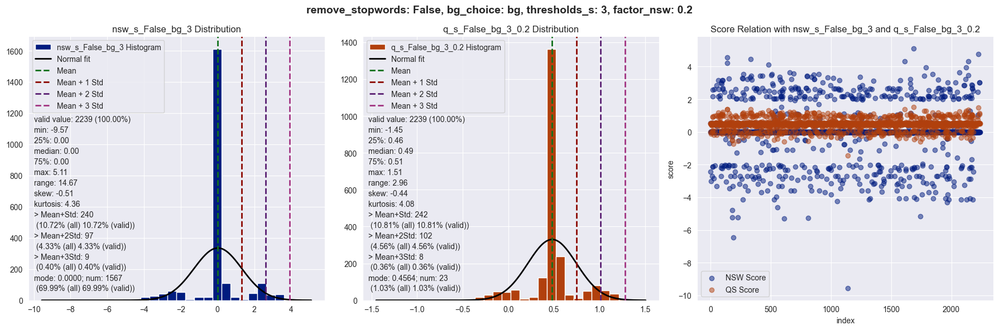

top 10 nsw_s_False_bg_3:

Top 1: 5.1059, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 2: 4.7760, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 3: 4.5643, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.4672, text: ['#handmade', '#hats', '#shopindie', 'custom', 'far', 'good', 'hat', 'long', 'looking', 'pretty', 'today', 'version', 'way', 'yet']

Top 5: 4.3319, text: ['addict', 'air', 'alcoholic', 'behaviour', 'believe', 'cant', 'disgraceful', 'drinking', 'drug', 'well']

Top 6: 4.3319, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 7: 4.2171, text: ['along', 'created', 'cycling', 'fakenham', 

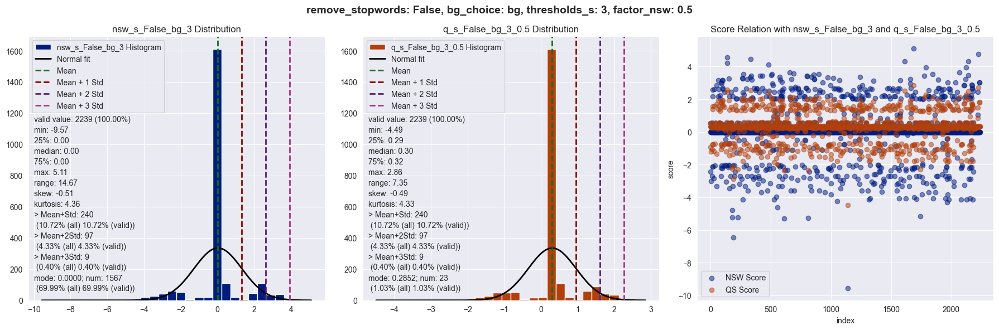

top 10 nsw_s_False_bg_3:

Top 1: 5.1059, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 2: 4.7760, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 3: 4.5643, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.4672, text: ['#handmade', '#hats', '#shopindie', 'custom', 'far', 'good', 'hat', 'long', 'looking', 'pretty', 'today', 'version', 'way', 'yet']

Top 5: 4.3319, text: ['addict', 'air', 'alcoholic', 'behaviour', 'believe', 'cant', 'disgraceful', 'drinking', 'drug', 'well']

Top 6: 4.3319, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 7: 4.2171, text: ['along', 'created', 'cycling', 'fakenham', 

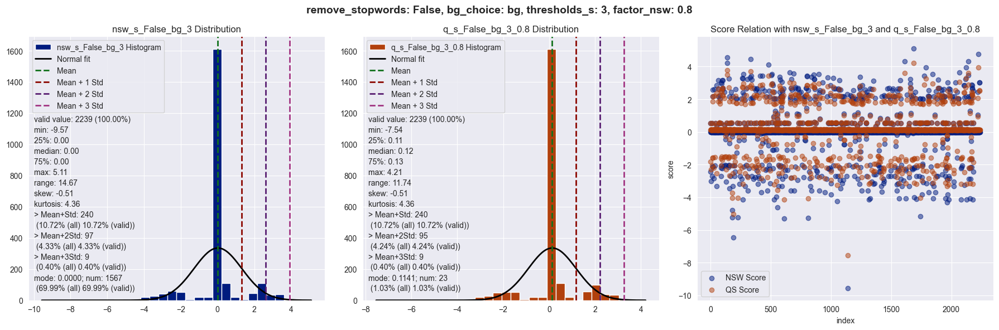

top 10 nsw_s_False_bg_3:

Top 1: 5.1059, text: ['#booknow', '#cuttingedgemechanics', '#winterservicing', 'book', 'dont', 'full', 'please', 'servicing', 'spring', 'swing', 'wait']

Top 2: 4.7760, text: ['#Retail', '71559', 'barista', 'high', 'hiring', 'holborn', 'job', 'latest', 'opening', 'read', 'store']

Top 3: 4.5643, text: ['action', 'arising', 'away', 'blueprint', 'built', 'cant', 'conscience', 'defecating', 'deliberate', 'drinking', 'eating', 'running', 'threat', 'unconscious', 'walking', 'wiped']

Top 4: 4.4672, text: ['#handmade', '#hats', '#shopindie', 'custom', 'far', 'good', 'hat', 'long', 'looking', 'pretty', 'today', 'version', 'way', 'yet']

Top 5: 4.3319, text: ['addict', 'air', 'alcoholic', 'behaviour', 'believe', 'cant', 'disgraceful', 'drinking', 'drug', 'well']

Top 6: 4.3319, text: ['#FoxNews', 'day', 'drinking', 'hotels', 'migrants', 'new', 'sex', 'stairs', 'taxpayerfunded', 'whistleblower', 'york']

Top 7: 4.2171, text: ['along', 'created', 'cycling', 'fakenham', 

,_id,text,score,nsw_s_True_bg_1,q_s_True_bg_1_0.2,q_s_True_bg_1_0.5,q_s_True_bg_1_0.8,nsw_s_True_bg_2,q_s_True_bg_2_0.2,q_s_True_bg_2_0.5,...,q_s_False_bg_1_0.5,q_s_False_bg_1_0.8,nsw_s_False_bg_2,q_s_False_bg_2_0.2,q_s_False_bg_2_0.5,q_s_False_bg_2_0.8,nsw_s_False_bg_3,q_s_False_bg_3_0.2,q_s_False_bg_3_0.5,q_s_False_bg_3_0.8
0,1613006911946776576,"[confidence, dont, fix, lost, need, negative, ...",0.636730,-1.104817,0.288421,-0.234044,-0.756508,0.000000,0.509384,0.318365,...,0.318365,0.127346,0.000000,0.509384,0.318365,0.127346,0.000000,0.509384,0.318365,0.127346
1,1613006916246179840,"[academic, age, approaching, best, biogerontol...",0.614933,-1.728892,0.146168,-0.556979,-1.260127,-2.835349,-0.075123,-1.110208,...,-0.916606,-1.835530,-2.448146,0.002317,-0.916606,-1.835530,-2.448146,0.002317,-0.916606,-1.835530
2,1613006917810683904,"[album, dreams, london, underrated]",0.541453,0.172395,0.467641,0.356924,0.246207,0.031163,0.439395,0.286308,...,0.316738,0.181910,0.092024,0.451567,0.316738,0.181910,0.545139,0.542190,0.543296,0.544401
3,1613006921556185089,"[apartment, leaky, month, new, paying, pipes, ...",0.636528,0.000000,0.509222,0.318264,0.127306,0.000000,0.509222,0.318264,...,0.318264,0.127306,0.000000,0.509222,0.318264,0.127306,0.000000,0.509222,0.318264,0.127306
4,1613006922894000128,"[carabao, confirmed, congestion, cup, dates, f...",0.589902,-0.034054,0.465111,0.277924,0.090737,-0.034054,0.465111,0.277924,...,0.311439,0.144362,0.032976,0.478517,0.311439,0.144362,0.032976,0.478517,0.311439,0.144362
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2234,1615746986057007113,"[@Sunita_Says_, provoking, thought]",0.665500,0.000000,0.532400,0.332750,0.133100,0.000000,0.532400,0.332750,...,0.332750,0.133100,0.000000,0.532400,0.332750,0.133100,0.000000,0.532400,0.332750,0.133100
2235,1615746987940511744,"[@GMB, @Lilly26062173, @edballs, beds, care, d...",0.586667,1.193662,0.708066,0.890165,1.072263,1.679682,0.805270,1.133174,...,1.109897,1.423836,3.007103,1.070754,1.796885,2.523016,3.007103,1.070754,1.796885,2.523016
2236,1615746988481314818,"[2nd, @leahwillFP6, allowed, arsenal, beth, cl...",0.674884,1.181516,0.776210,0.928200,1.080189,1.452004,0.830308,1.063444,...,0.825843,0.916418,1.146755,0.769258,0.910819,1.052381,3.007103,1.141328,1.840993,2.540659
2237,1615746990251593729,"[eat, say, wanna, wear]",0.629744,-2.208712,0.062052,-0.789484,-1.641021,-2.208712,0.062052,-0.789484,...,-0.615302,-1.362330,-1.860348,0.131725,-0.615302,-1.362330,0.000000,0.503795,0.314872,0.125949


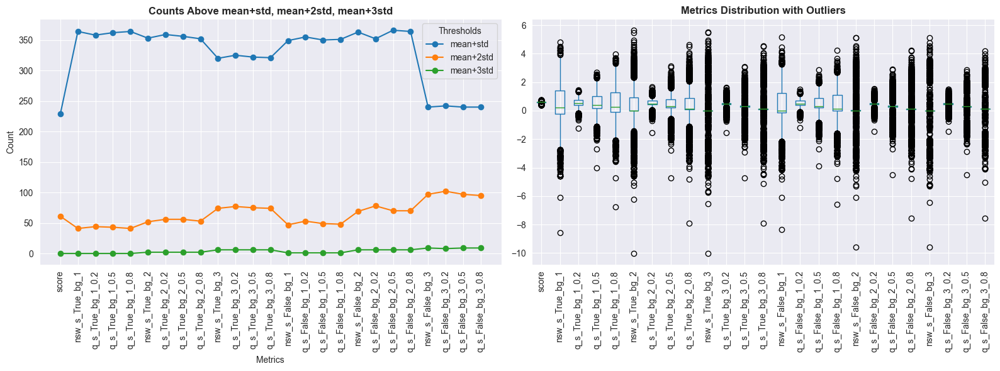

In [53]:
CURRENT_OUTPUT = 'pictureOutput/task2'
statistic2()

## Task 3

In [54]:
def grid_points_to_dataframe(gridPoints):
    """
    将 GridPoint 实例列表转换为 DataFrame
    
    :param gridPoints: 点阵网格实例列表
    :return: DataFrame格式的数据
    """
    print_level('-------- Start GridPointsToDataFrame --------', 1)

    # 创建一个空列表，用于存储每个 GridPoint 的数据
    data_list = []

    # 遍历 GridPoint 实例列表，提取需要的数据
    for gp in gridPoints:
        # 从 gp.tweet 中提取需要的信息
        data_dict = {
            'row': gp.row,
            'column': gp.column,
            'id': gp.id,
            'text': gp.text,
            'score': gp.score,
            'token_text_remove_stopwords': gp.token_text_remove_stopwords,
            'token_text_keep_stopwords': gp.token_text_keep_stopwords,
        }
        data_list.append(data_dict)

    # 使用提取的数据列表创建 DataFrame
    dfGridPointsSorted = pd.DataFrame(data_list)

    # 显示 DataFrame 的前几行，以检查数据
    print_level(dfGridPointsSorted.head(), 1)

    return dfGridPointsSorted

In [55]:
def draw_heatmap_histogram(df, column_name, condition=None):
    """
    绘制热力图和直方图作为子图，只统计满足特定条件的行和列。
    :param df: DataFrame，包含多列数据。
    :param column_name: 要检查条件的列名。
    :param condition: 用于筛选的条件函数。
    """
    if condition is not None:
        filtered_df = df[condition]
    else:
        filtered_df = df
        
    # 获取网格的行数和列数
    num_rows = g_grids.num_rows
    num_columns = g_grids.num_columns
    
    # 创建计数矩阵
    count_matrix = np.zeros((num_rows, num_columns))

    # 更新计数矩阵
    for index, row in filtered_df.iterrows():
        # 确保网格索引在范围内
        if 0 <= row['row'] < num_rows and 0 <= row['column'] < num_columns:
            count_matrix[row['row'], row['column']] += 1

    # 设置子图布局
    fig, axs = plt.subplots(1, 2, figsize=(20, 8))

    # 绘制热力图
    sns.heatmap(count_matrix, cmap='RdBu_r', norm=matplotlib.colors.LogNorm(), ax=axs[0])
    heatmap_title = f'Heatmap of tweet counts - London {column_name}'
    axs[0].set_title(heatmap_title)

    # 准备直方图数据
    count_matrix_flattened = count_matrix.flatten()

    # 绘制直方图
    sns.histplot(count_matrix_flattened, bins=50, kde=False, ax=axs[1])
    histogram_title = f'Distribution of number - London{column_name}'
    axs[1].set_title(histogram_title)
    axs[1].set_xlabel('Number of tweets')
    axs[1].set_ylabel('Number of grids')
    axs[1].set_yscale('log')

    # 调整布局
    plt.tight_layout()

    # 保存和显示图像
    file_name = f'heatmap_histogram_{column_name}.png'
    plt.savefig(os.path.join(f'{CURRENT_OUTPUT}', file_name))
    plt.show()

In [56]:
def statistic3():
    # task3 数据处理
    df_geo = grid_points_to_dataframe(g_grid_points)
    print_level(f'len: {len(df_geo)}', 0)
    condition_remove_stopwords = [True, False]
    
    # condition_bg_choice = ['geo', 'bg+geo']
    # condition_thresholds_s = [1, 2, 3]
    # condition_factor_nsw = [0.2, 0.5, 0.8]

    condition_bg_choice = ['bg+geo']
    condition_thresholds_s = [1, ]
    condition_factor_nsw = [0.2, 0.8]
    
    # 用于显示进度
    times = len(condition_remove_stopwords) * len(condition_bg_choice) * len(condition_thresholds_s) * len(condition_factor_nsw)
    
    time = 1
    for remove_stopwords in condition_remove_stopwords:
        for bg_choice in condition_bg_choice:
            for thresholds_s in condition_thresholds_s:
                for factor_nsw in condition_factor_nsw:
                    print_level(f'---- {time} / {times} ---- remove_stopwords: {remove_stopwords}, bg_choice: {bg_choice}, thresholds_s: {thresholds_s}, factor_nsw: {factor_nsw}--------', 0)
                    newsworthiness_scoring(df_geo, True, remove_stopwords, bg_choice, thresholds_s, factor_nsw)
                    
    display(df_geo)
    draw_total_statistic(df_geo, True)
    df_geo.to_csv('TempData/df_geo.csv')
    

In [57]:
grid_points_to_dataframe(g_grid_points)

,row,column,id,text,score,token_text_remove_stopwords,token_text_keep_stopwords
0,28,31,1565429028747616256,"Just posted a photo @ London, United Kingdom h...",0.554386,"[kingdom, london, photo, posted, united]","[just, kingdom, london, photo, posted, united]"
1,28,31,1565428982660603907,"Just posted a photo @ London, United Kingdom h...",0.590283,"[kingdom, london, photo, posted, united]","[just, kingdom, london, photo, posted, united]"
2,28,27,1565428290017443846,Just posted a photo @ Eliza Jane Howell https:...,0.591719,"[eliza, howell, jane, photo, posted]","[eliza, howell, jane, just, photo, posted]"
3,23,33,1565427593851158528,"Just posted a photo @ London, Unιted Kingdom h...",0.592131,"[kingdom, london, photo, posted, ted, un]","[just, kingdom, london, photo, posted, ted, un]"
4,28,31,1565425981246115842,A fun day murdering in London Town for the fir...,0.664139,"[#OrganiseEvents, @themarcusmassey, ages, day,...","[#OrganiseEvents, @themarcusmassey, ages, day,..."
...,...,...,...,...,...,...,...
13187,28,29,1575580078368378881,"Just posted a photo @ The Langham, London http...",0.588676,"[langham, london, photo, posted]","[just, langham, london, photo, posted, the]"
13188,27,29,1575579146775777280,"I'm at Viet Food in London, Greater London htt...",0.569792,"[food, greater, im, london, viet]","[at, food, greater, im, in, london, viet]"
13189,28,31,1575578499121041408,"Just posted a photo @ London, United Kingdom h...",0.592224,"[kingdom, london, photo, posted, united]","[just, kingdom, london, photo, posted, united]"
13190,30,31,1575577168826232832,Drinking a Studio Lager by @SignatureBrew at @...,0.607921,"[@SignatureBrew, @thelexington, drinking, lage...","[@SignatureBrew, @thelexington, at, by, drinki..."


len: 13192
---- 1 / 4 ---- remove_stopwords: True, bg_choice: bg+geo, thresholds_s: 1, factor_nsw: 0.2--------


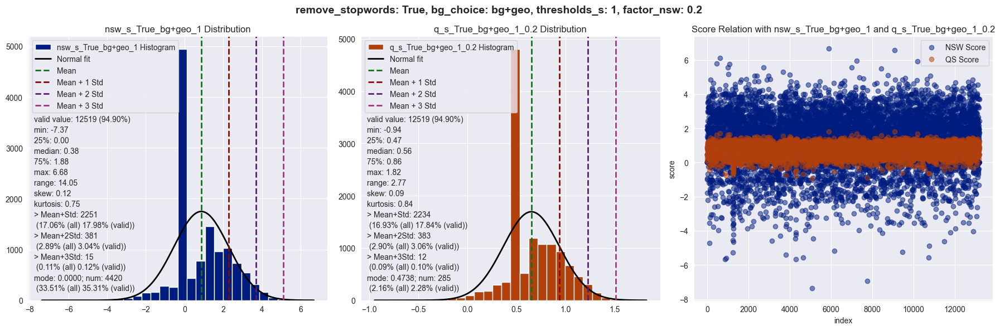

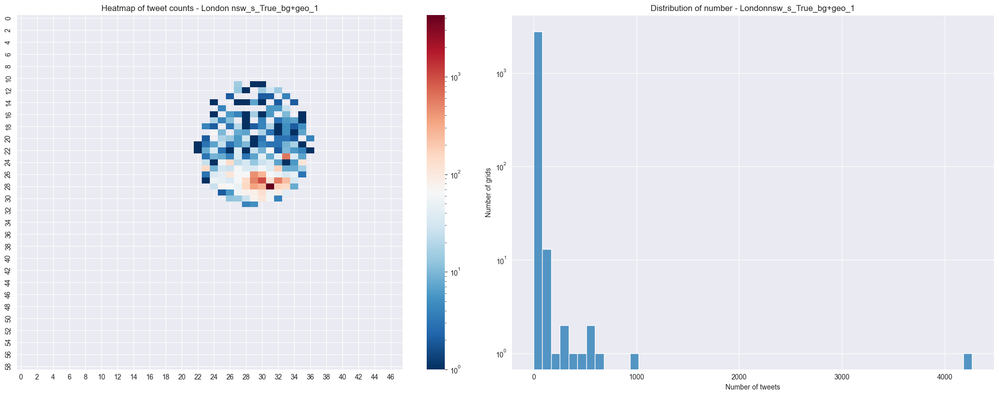

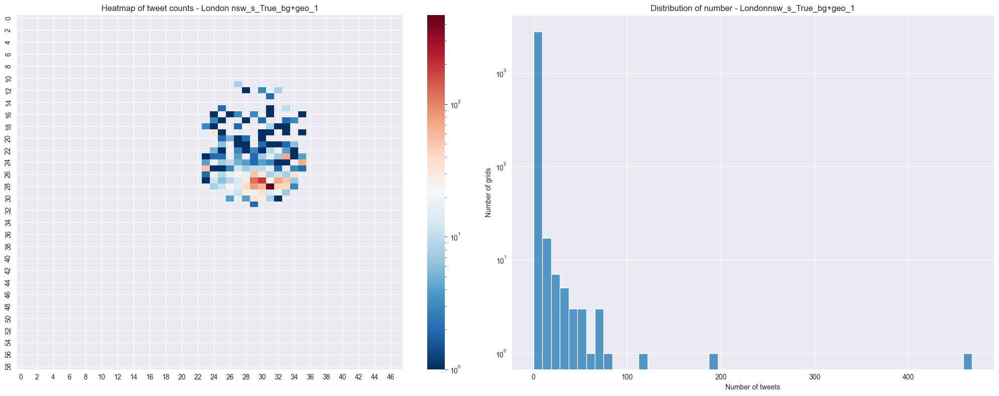

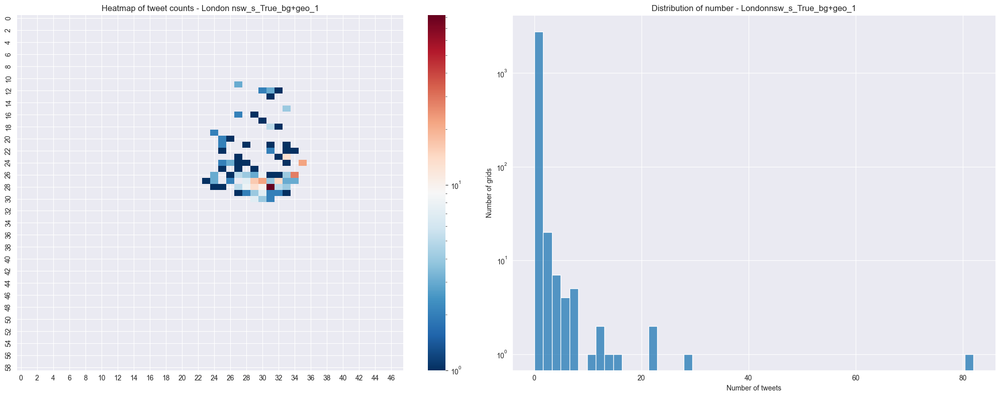

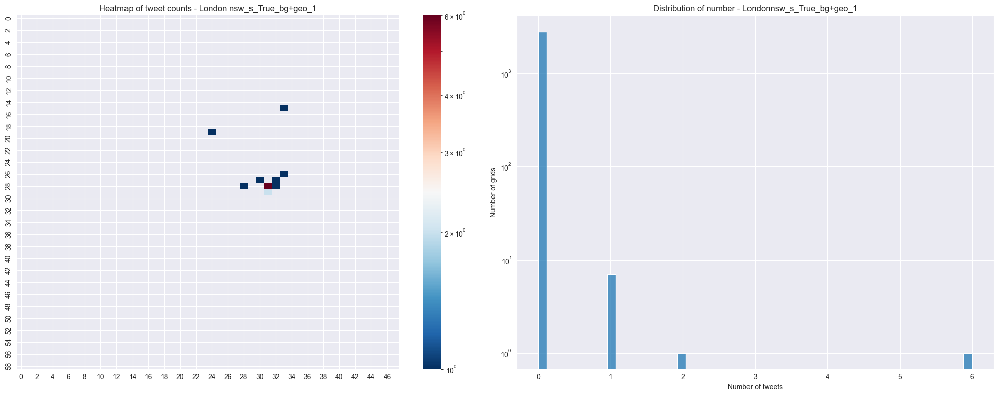

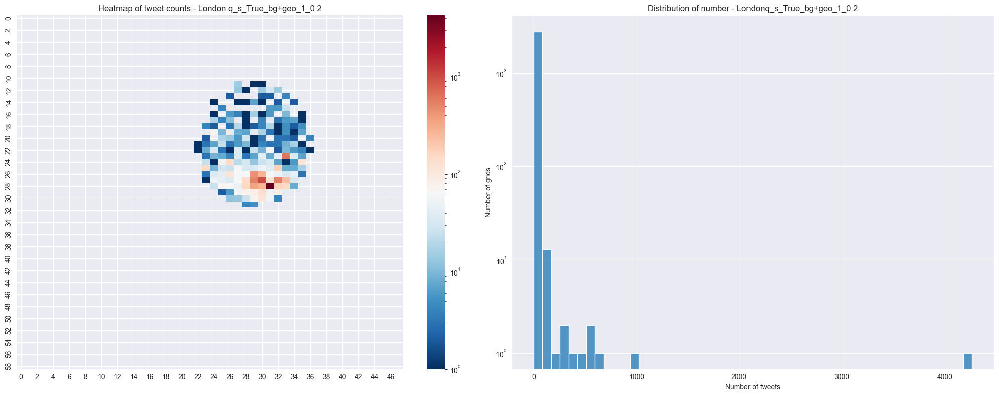

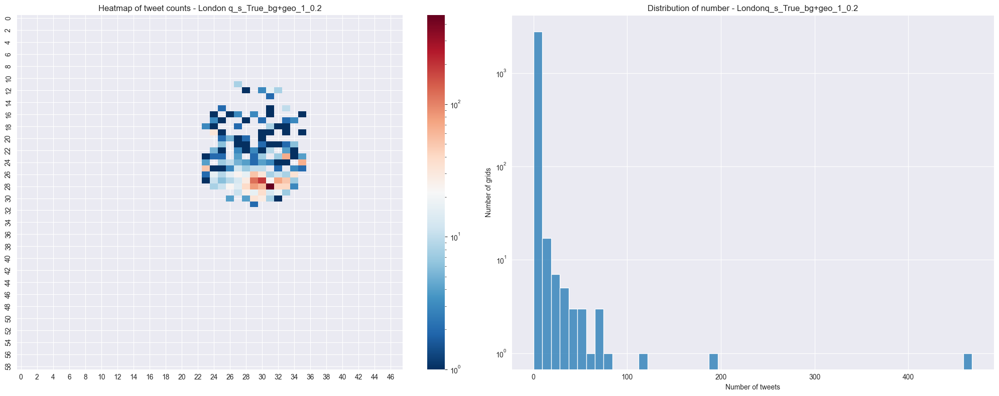

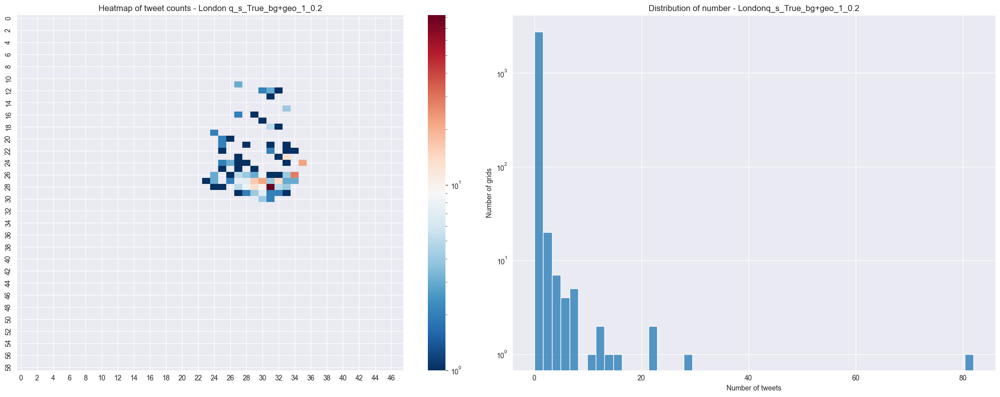

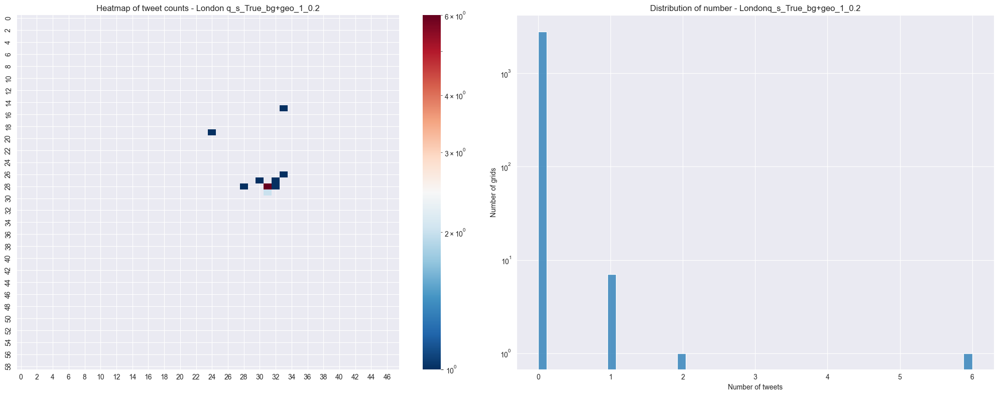

top 10 nsw_s_True_bg+geo_1:

Top 1: 6.6780, text: #MartinFreeman
Always super cute!  
What a sweetie seriously 
Somewhere in London in 2009

#TheHobbit #BilboBaggins #Sherlock #JohnWatson @ London, United Kingdom https://t.co/dZo1oG0Tqs

Top 2: 6.5718, text: The Shard 
#london #uk spring #cloudy #clouds #architecture #steel #glass #skyline #cityscape @ London, United Kingdom https://t.co/MFml7mVoYz

Top 3: 6.1056, text: LIFE IN BLOOM | Forever Mood. Gucci Bloom Profumo Di Fiori, Personified By Florals, Born To Bloom️FR
-
#gucci #bloom #forher @ The Shard London https://t.co/ytDBxVZMPF

Top 4: 5.9467, text: #me #italian #italiangirl #pink #outfit #outfitoftheday #sunny #sunnyday #selfie #london #londonlife #blonde #blondehair #blondegirl #happiness #dayoff #drmartens #glasses #lipstick @ London, United Kingdom https://t.co/EG69Vyu7Ae

Top 5: 5.9109, text: Large Cod Fish and Chips and an Old Jamaica Ginger Beer. (@ Johnny's Fish Bar in Bermondsey) https://t.co/jB7awRBONP

Top 6: 5.7957, 

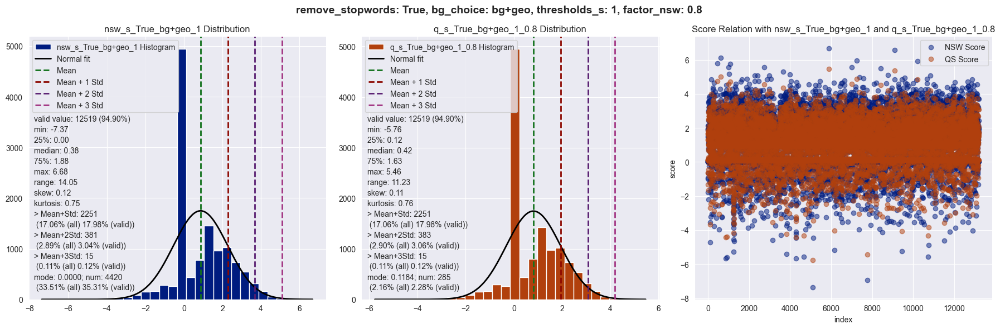

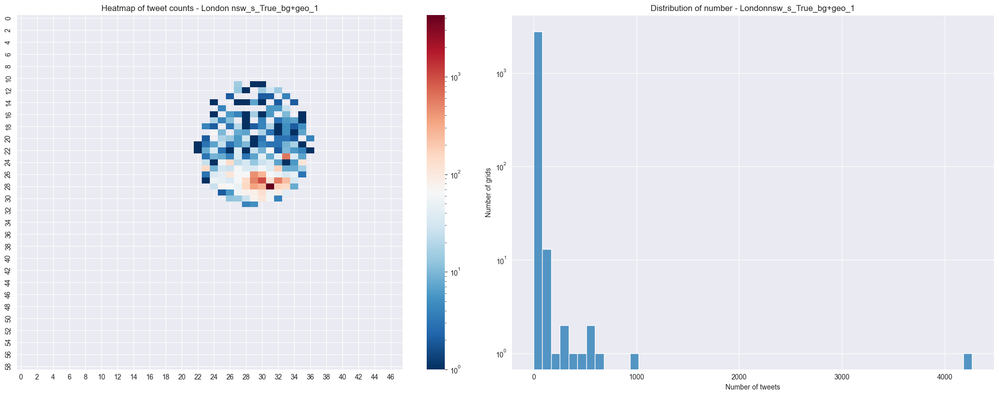

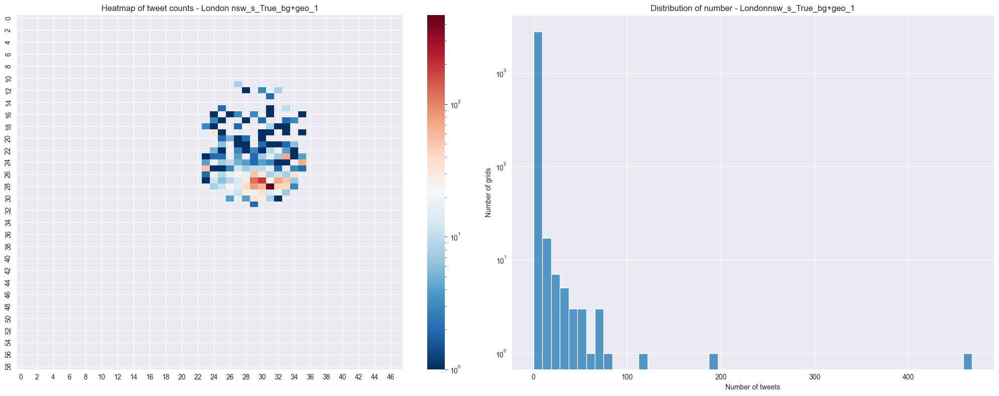

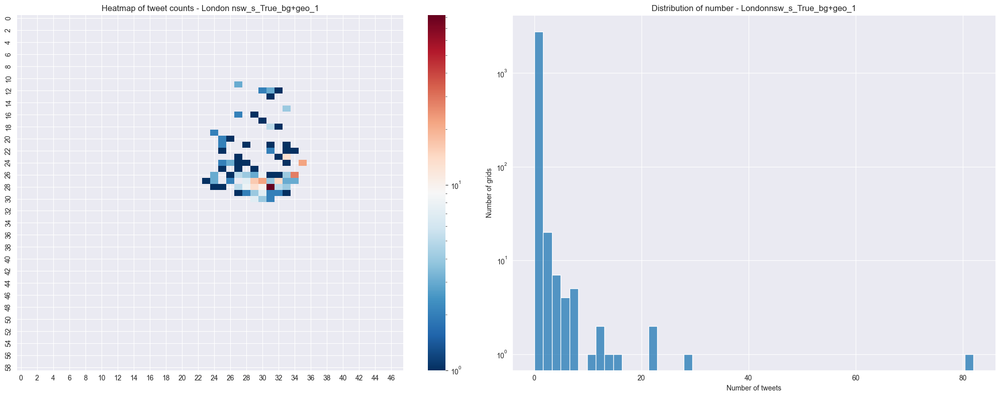

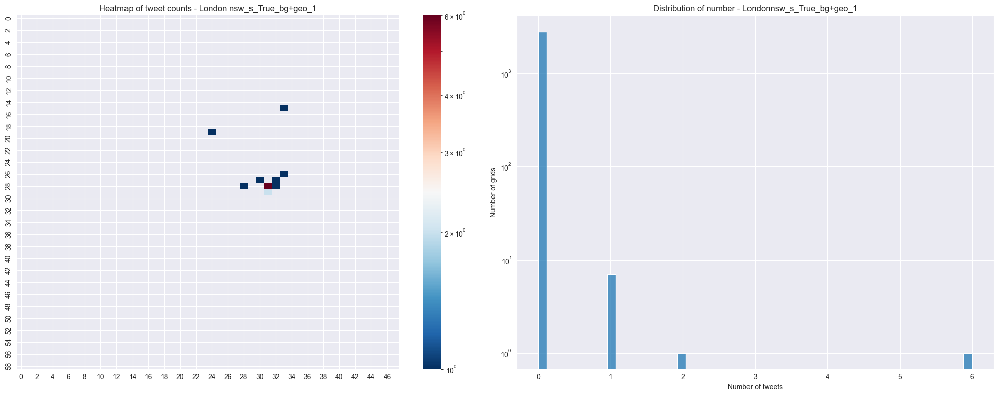

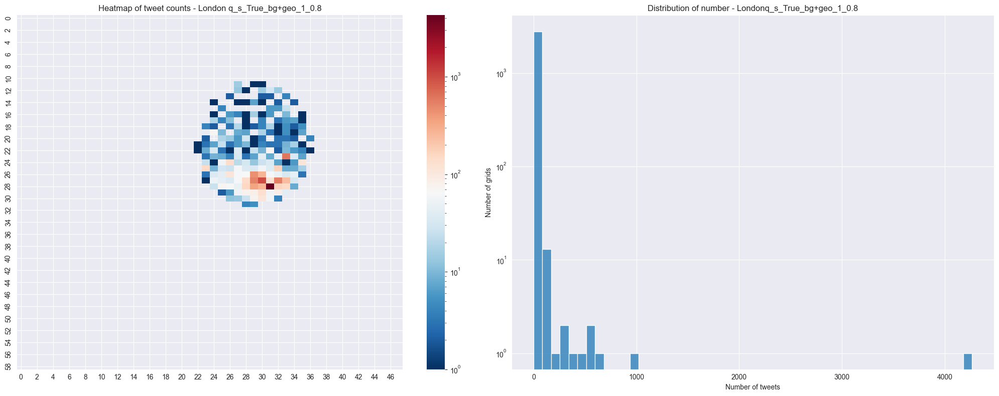

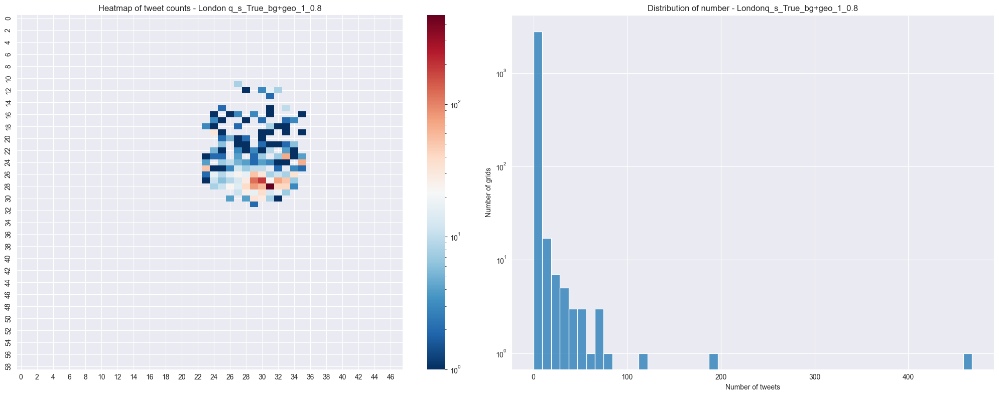

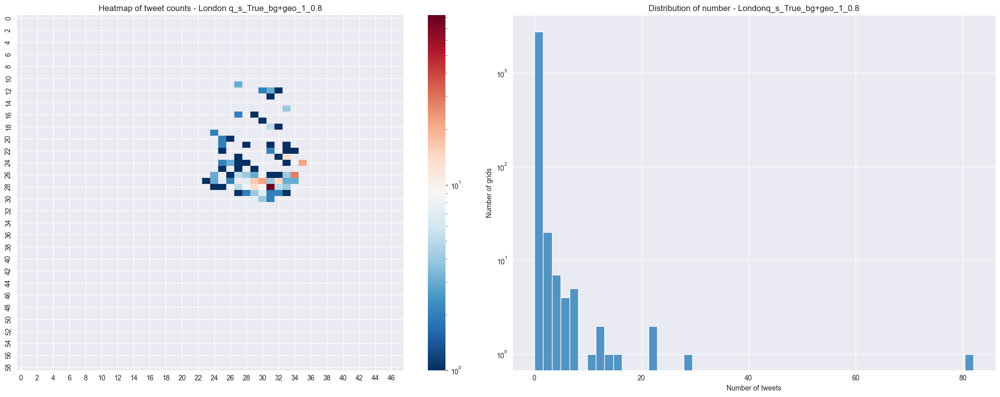

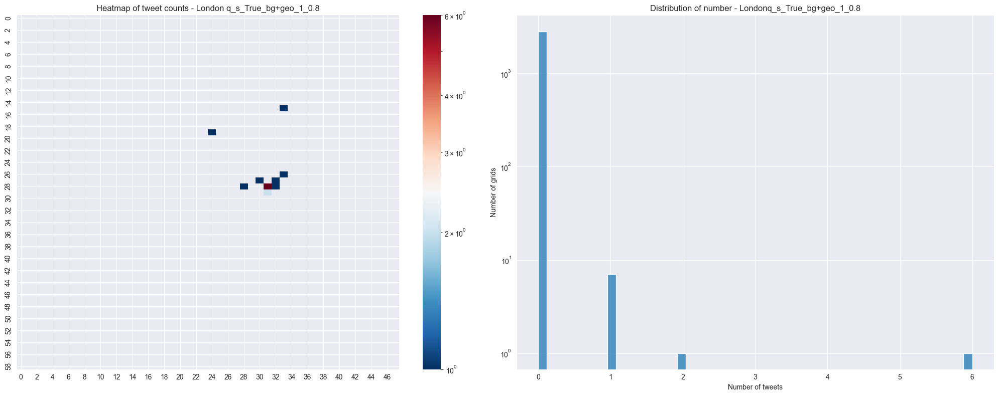

top 10 nsw_s_True_bg+geo_1:

Top 1: 6.6780, text: #MartinFreeman
Always super cute!  
What a sweetie seriously 
Somewhere in London in 2009

#TheHobbit #BilboBaggins #Sherlock #JohnWatson @ London, United Kingdom https://t.co/dZo1oG0Tqs

Top 2: 6.5718, text: The Shard 
#london #uk spring #cloudy #clouds #architecture #steel #glass #skyline #cityscape @ London, United Kingdom https://t.co/MFml7mVoYz

Top 3: 6.1056, text: LIFE IN BLOOM | Forever Mood. Gucci Bloom Profumo Di Fiori, Personified By Florals, Born To Bloom️FR
-
#gucci #bloom #forher @ The Shard London https://t.co/ytDBxVZMPF

Top 4: 5.9467, text: #me #italian #italiangirl #pink #outfit #outfitoftheday #sunny #sunnyday #selfie #london #londonlife #blonde #blondehair #blondegirl #happiness #dayoff #drmartens #glasses #lipstick @ London, United Kingdom https://t.co/EG69Vyu7Ae

Top 5: 5.9109, text: Large Cod Fish and Chips and an Old Jamaica Ginger Beer. (@ Johnny's Fish Bar in Bermondsey) https://t.co/jB7awRBONP

Top 6: 5.7957, 

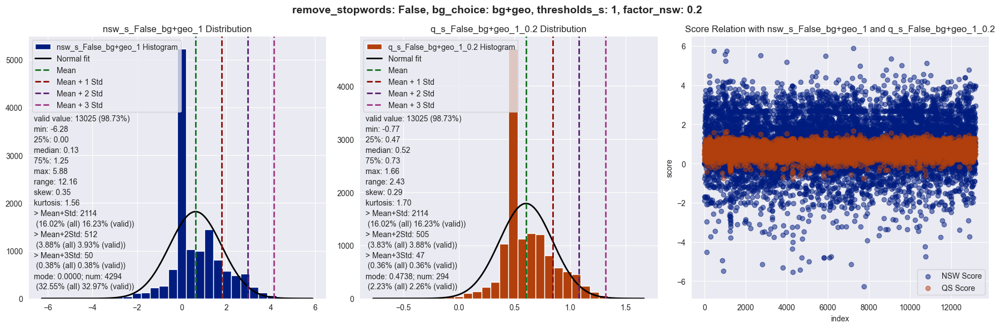

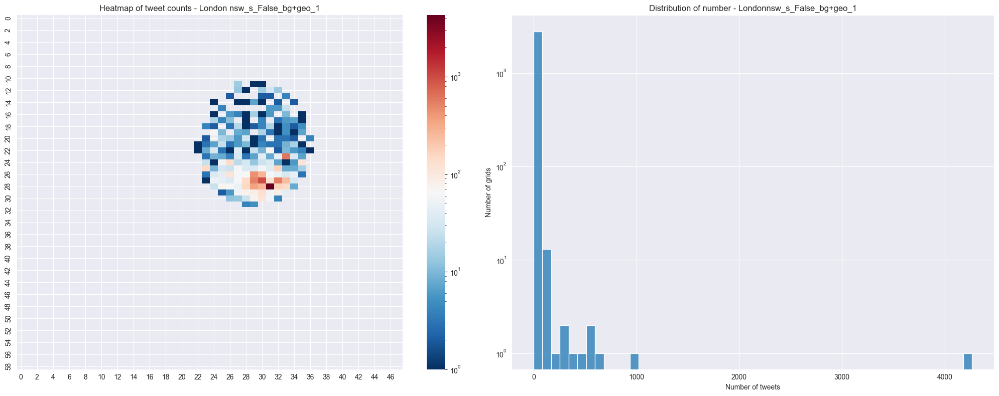

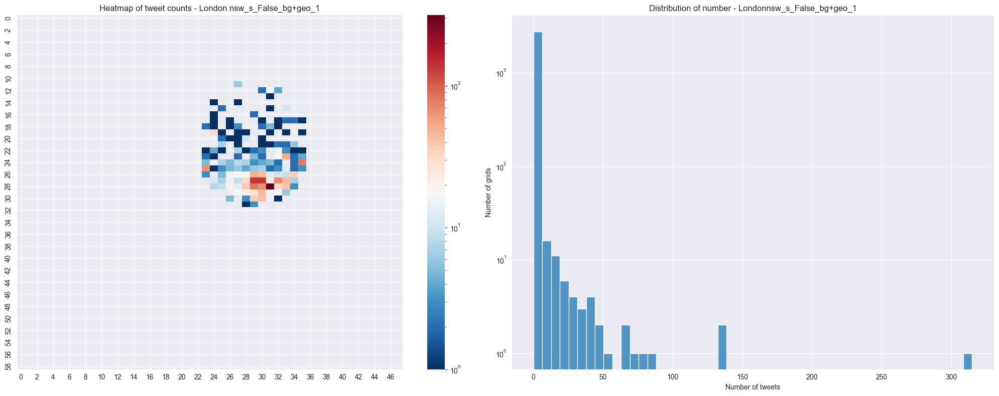

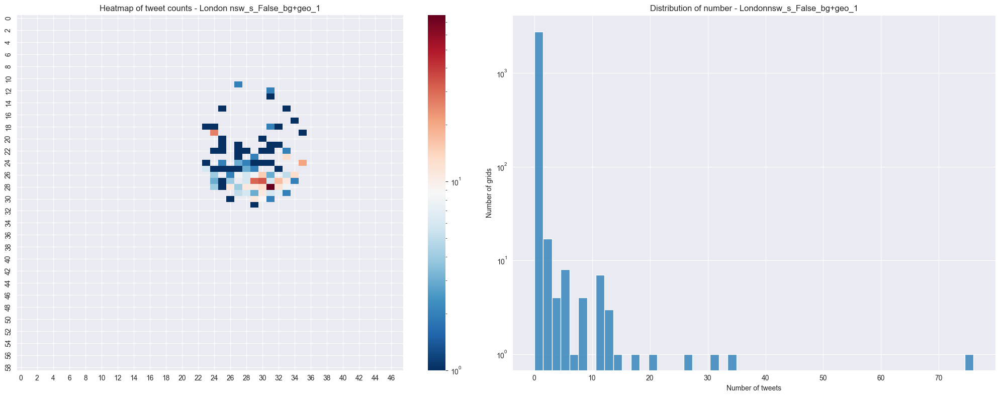

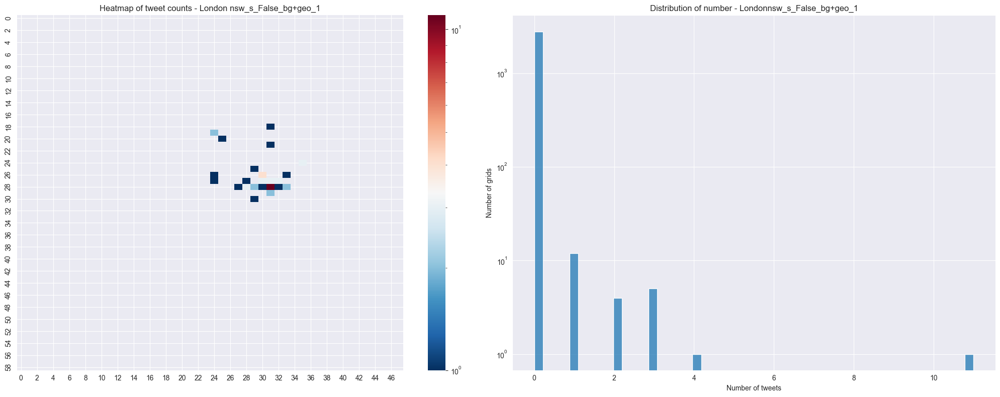

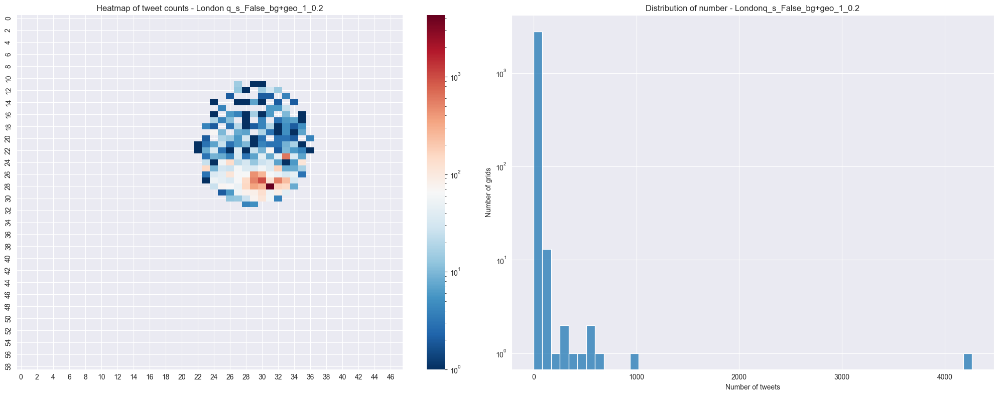

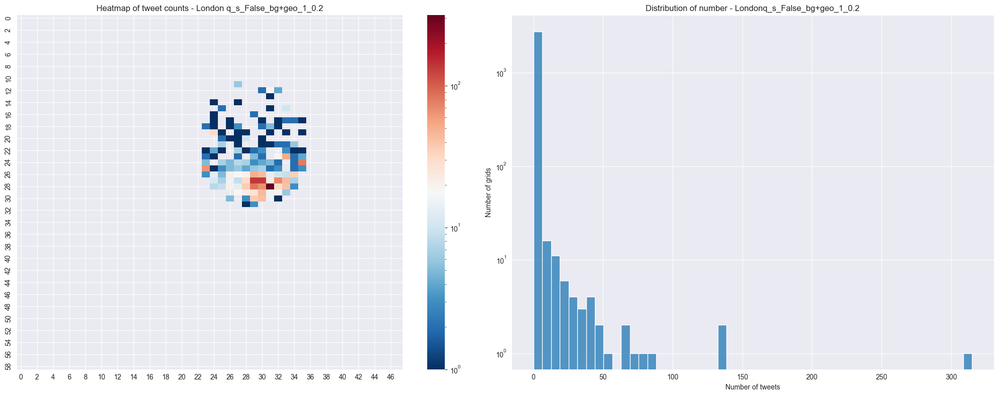

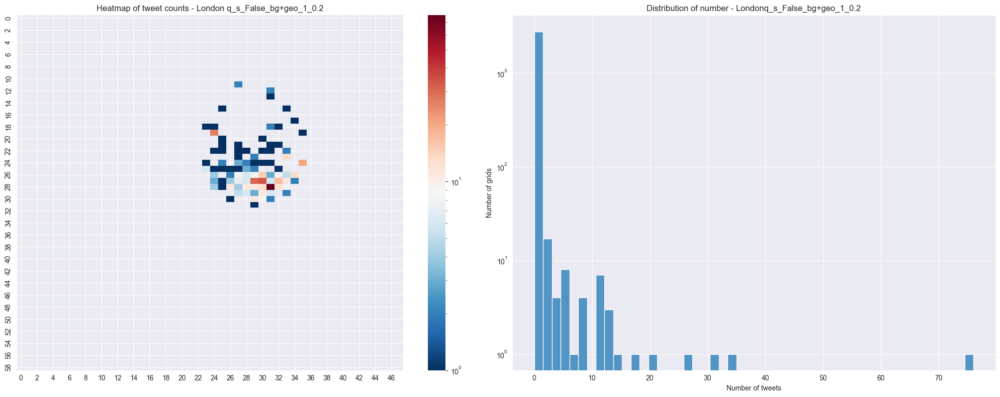

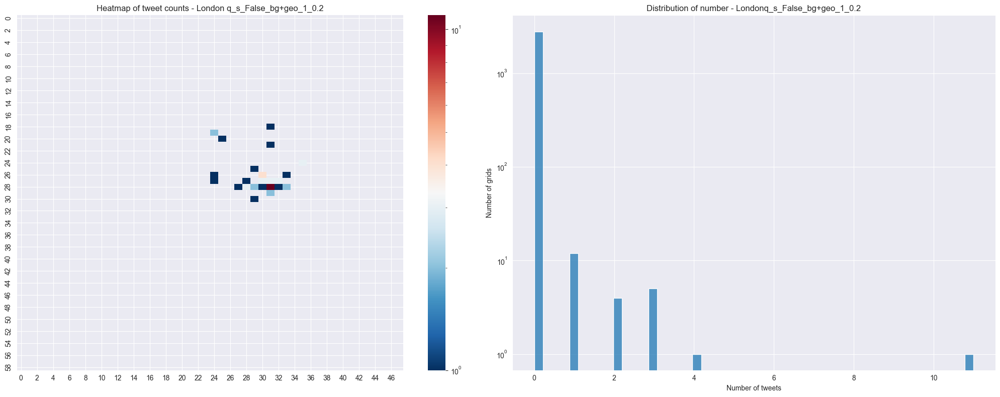

top 10 nsw_s_False_bg+geo_1:

Top 1: 5.8823, text: #me #italian #italiangirl #pink #outfit #outfitoftheday #sunny #sunnyday #selfie #london #londonlife #blonde #blondehair #blondegirl #happiness #dayoff #drmartens #glasses #lipstick @ London, United Kingdom https://t.co/EG69Vyu7Ae

Top 2: 5.7326, text: #PunkDay2022 (@ BrewDog Clerkenwell - @brewdogcwell in London) https://t.co/yP2thJQgDX

Top 3: 5.7313, text: Just posted a photo @ St James Church, Clerkenwell https://t.co/bzLivfByTo

Top 4: 5.5683, text: Such a handsome boy! #blacklab #blacklaba #blacklabsofinstagram @ London, United Kingdom https://t.co/H0ZY8AjA8x

Top 5: 5.5153, text: #candles #candle #candleholder #tray #black #blackcandle #candlesofinstagram #smallshop #smallbusinessuk #smallbusiness #candlelover #candletray #roses #darkaesthetic #dark @ United Kingdom https://t.co/IcF0N7lMqS

Top 6: 5.4739, text: #MartinFreeman
Always super cute!  
What a sweetie seriously 
Somewhere in London in 2009

#TheHobbit #BilboBaggins #Sh

In [ ]:
CURRENT_OUTPUT = 'pictureOutput/task3'
PRINT_LEVEL = 0
statistic3()



bg方案1：使用task2中提供的bg，不行，因为有的不存在，分母会为0
bg方案2，使用geo的全部空间作为bg
bg方案3，使用geo的空间+task2的bg的空间作为bg

现在有newsworthiness_score
1. 计算其统计数据
2. 绘制箱线图和直方图
3. 打印得分最高的前N个和后N个推文

整体算法：
1. 遍历不同的条件，包括是否移除停用词，阈值S，新闻价值分数，背景使用Geo还是Geo+Bg数据
2. 使用info记录条件信息
2. 对每个条件，调用loopTest函数，处理得到的新闻价值分数
    1. 计算新闻价值分数
    2. 处理得到的新闻价值分数
        1. 将GridPoint实例列表转换为DataFrame
        2. 计算并记录描述性统计数据
    3. 绘制箱线图和直方图
    4. 打印得分最高的前N个和后N个推文
    5. 返回记录统计数据的DataFrame
3. 将得到的描述性统计数据添加到info中
4. 显示info
5. 绘制网格图和直方图


